In [ ]:
# mount drive with files

from google.colab import drive
drive.mount('/content/drive')


!pip install -q "monai-weekly[nibabel, tqdm, einops]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline


Mounted at /content/drive
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.7 MB/s eta 0:00:00


In [ ]:
# import libraries

from torch.utils.data import DataLoader, ConcatDataset

import os
import shutil
import tempfile
import time
import torch
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import nibabel as nib

from monai.losses import DiceCELoss, GeneralizedDiceLoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AddChanneld,
    Compose,
    LoadImaged,
    ScaleIntensityd,
    RandGaussianNoised,
    RandGaussianSmoothd,
    ToTensord,
    RandGibbsNoised,
    RandKSpaceSpikeNoised,
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.networks.nets import UNet

from monai.data import (
    DataLoader,
    SmartCacheDataset,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
)


# switch off warning messages
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# set dimensions of the input images (128x128x128) and number of classes (number of labels + background)
img_dim=128
lab_num=1
class_num=lab_num+1

degree_min = -1
degree_max = 1

roi_type="face_"

split_JSON = "face-training-1-lab-v1.json"
split_JSON_run = "face-training-1-lab-v1.json"



root_dir='/content/drive/MyDrive/face-seg-project-2023/new-training-062023/'
data_dir = '/content/drive/MyDrive/face-seg-project-2023/new-training-062023/'

print(root_dir)
os.chdir(root_dir)



/content/drive/MyDrive/face-seg-project-2023/new-training-062023/


In [ ]:
# # define data loaders and augmentation for training and validation

train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        AddChanneld(keys=["image", "label"]),
        ScaleIntensityd(
            keys=["image"], minv=0.0, maxv=1.0
        ),

        RandGaussianSmoothd(keys=["image"], sigma_x = (0.7, 1.0), sigma_y = (0.7, 1.0), sigma_z = (0.7, 1.0), prob=0.1, allow_missing_keys=False),

        RandKSpaceSpikeNoised(keys=["image"], prob=0.3, intensity_range=(1.0, 1.5), allow_missing_keys=False),


        RandGibbsNoised(keys=["image"], alpha=(0.3,0.5), allow_missing_keys=False, prob=0.05),

        RandAffined(
            keys=["image", "label"],
            rotate_range=[(degree_min,degree_max),(degree_min,degree_max),(degree_min,degree_max)],
            mode=("bilinear", "nearest"),
            padding_mode=("zeros"),
            prob=0.9,
        ),
        ToTensord(keys=["image", "label"]),

    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        AddChanneld(keys=["image", "label"]),
        ScaleIntensityd(
            keys=["image"], minv=0.0, maxv=1.0
        ),
        ToTensord(keys=["image", "label"]),
    ]
)




In [ ]:
# load the files based on the lists in json

datasets = data_dir + split_JSON

datalist = load_decathlon_datalist(datasets, True, "training")

In [ ]:

train_ds = CacheDataset(
    data=datalist,
    transform=train_transforms,
    cache_num=200,
    cache_rate=1.0,
    num_workers=4,
)

train_loader = DataLoader(
    train_ds, batch_size=1, shuffle=True, num_workers=4, pin_memory=True
)


Loading dataset: 100%|██████████| 82/82 [00:31<00:00,  2.62it/s]


In [ ]:

val_files = load_decathlon_datalist(datasets, True, "validation")
val_ds = CacheDataset(
    data=val_files,
    transform=val_transforms,
    cache_num=80,
    cache_rate=1.0,
    num_workers=4
)
val_loader = DataLoader(
    val_ds, batch_size=1, shuffle=False, num_workers=4, pin_memory=True
)

Loading dataset: 100%|██████████| 12/12 [00:04<00:00,  2.67it/s]


Training Set
0 303-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


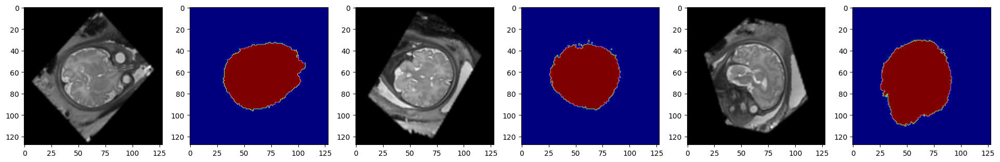

1 403-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


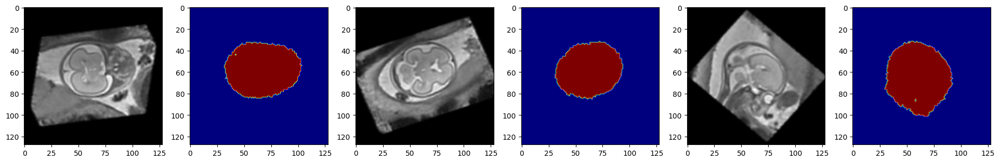

2 328-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


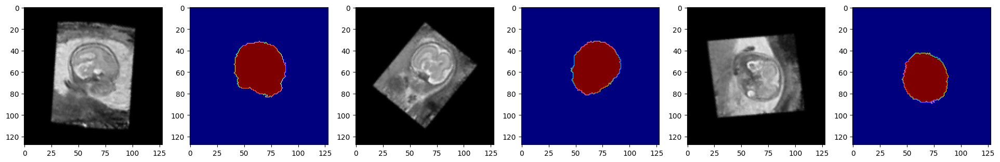

3 408-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


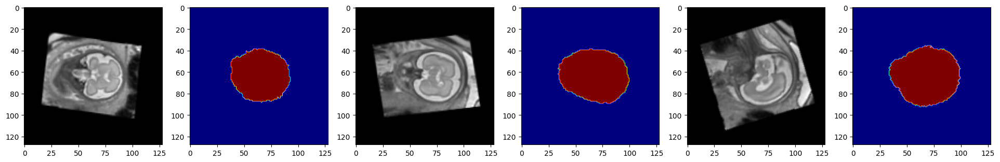

4 235-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


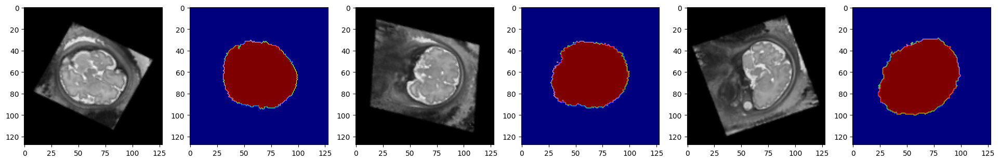

5 294-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


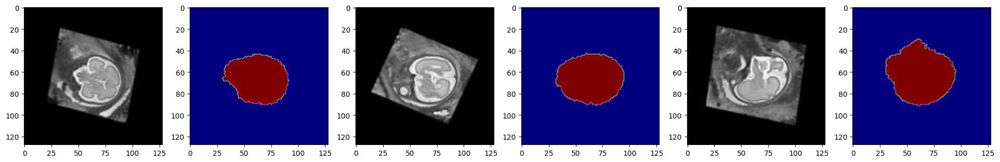

6 296-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


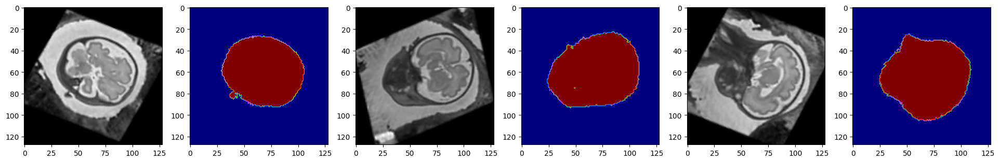

7 312-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


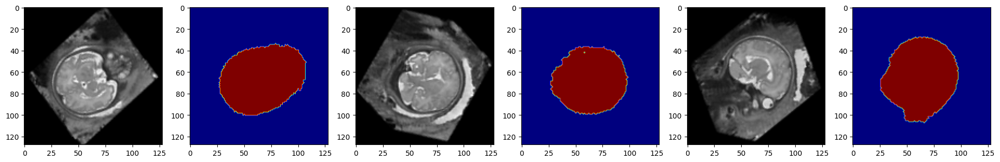

8 340-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


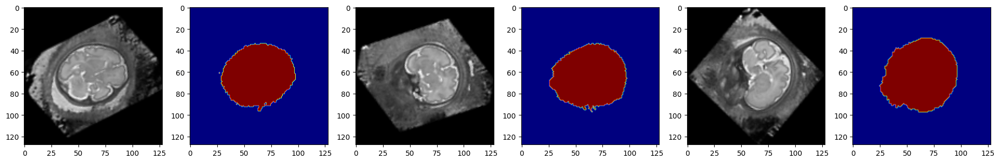

9 371-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


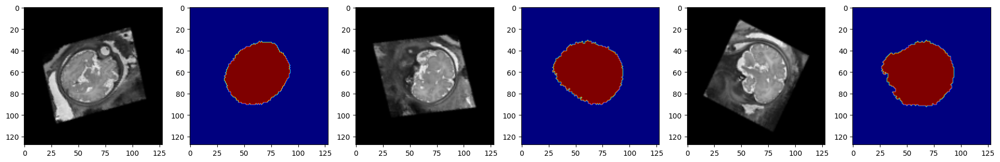

10 394-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


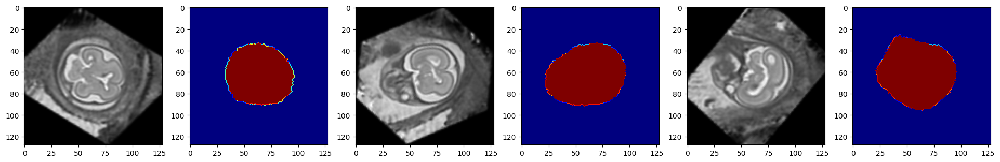

11 396-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


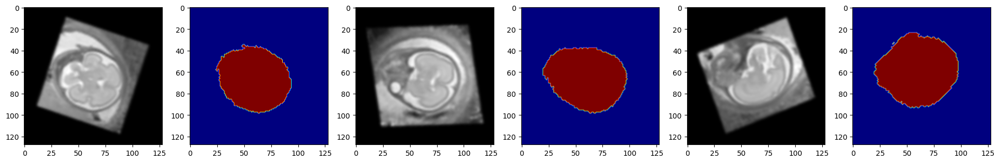

12 404-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


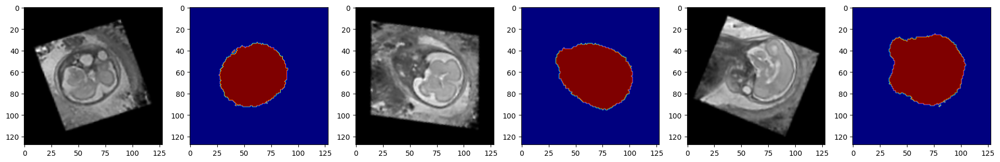

13 415-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


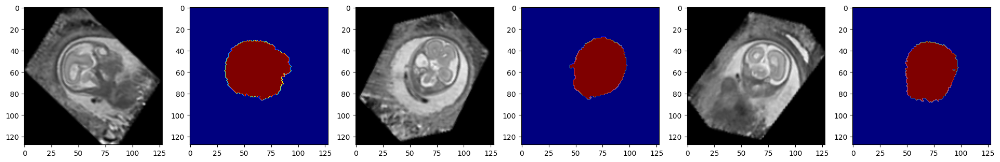

14 420-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


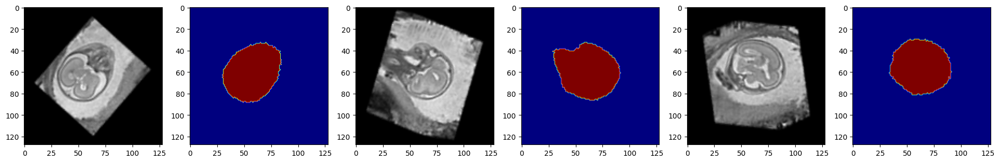

15 421-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


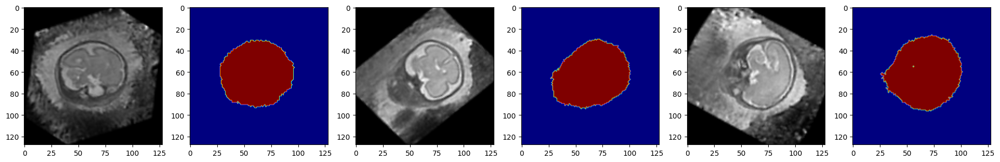

16 425-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


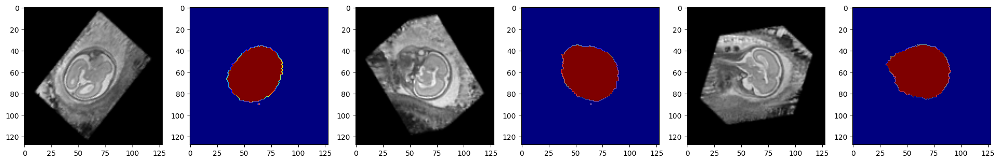

17 429-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


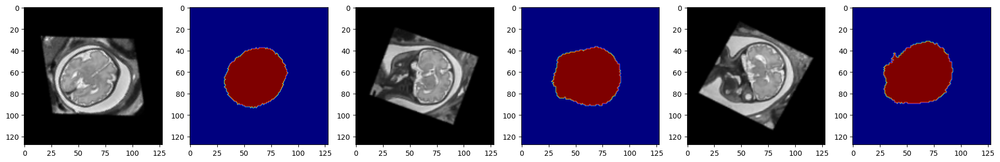

18 440-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


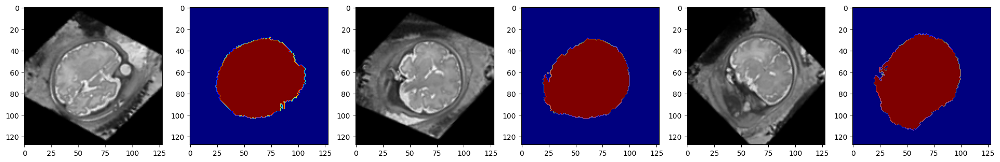

19 474-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


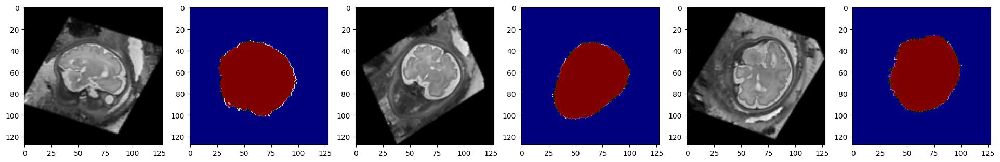

20 136-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


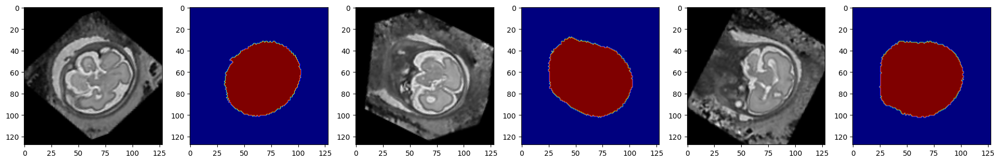

21 142-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


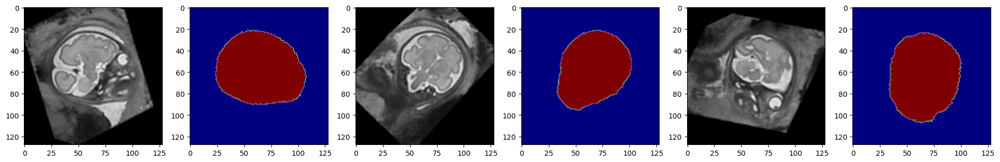

22 190-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


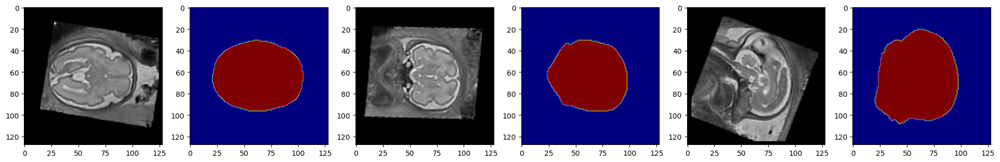

23 203-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


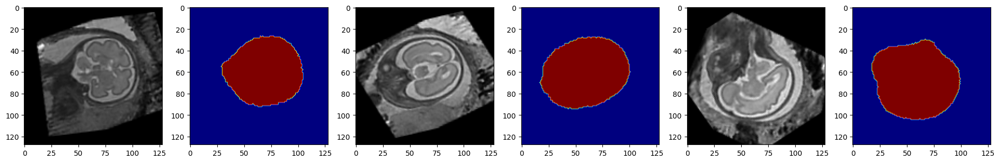

24 205-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


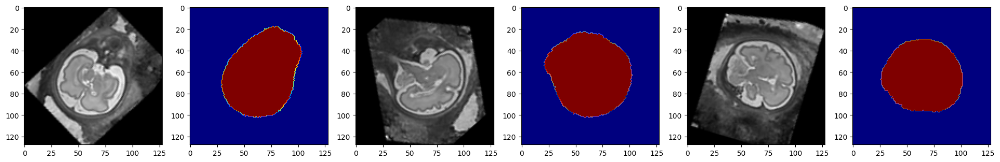

25 214-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


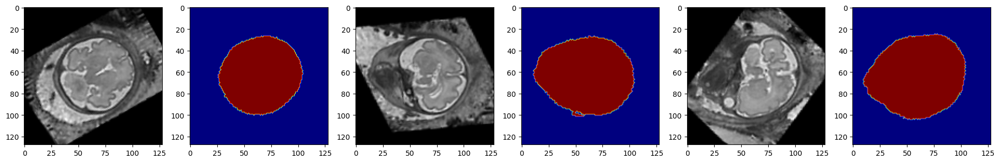

26 215-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


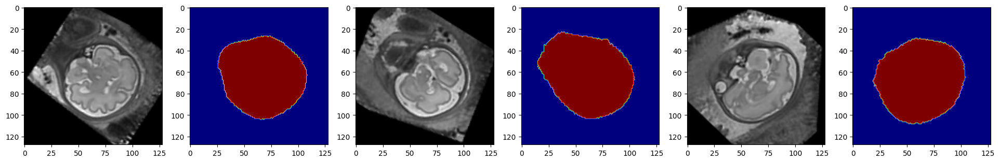

27 231-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


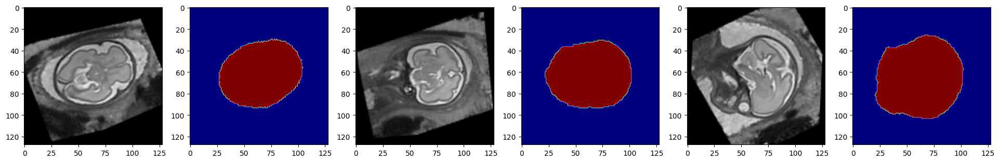

28 236-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


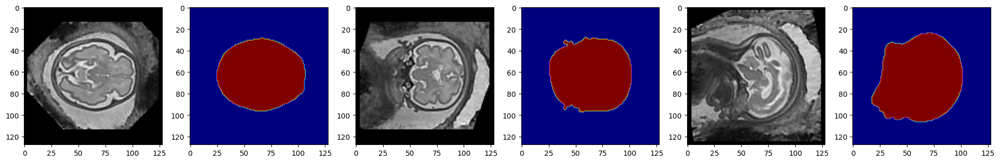

29 250-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


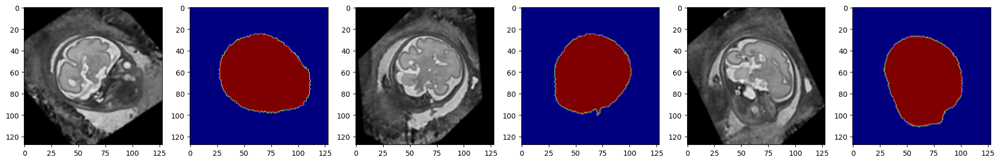

30 252-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


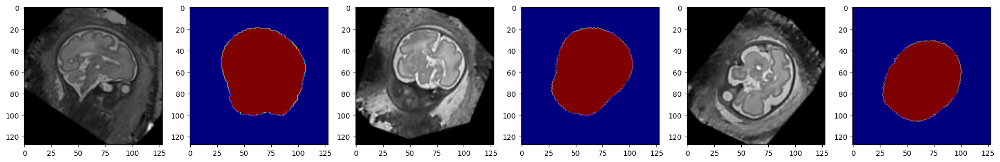

31 253-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


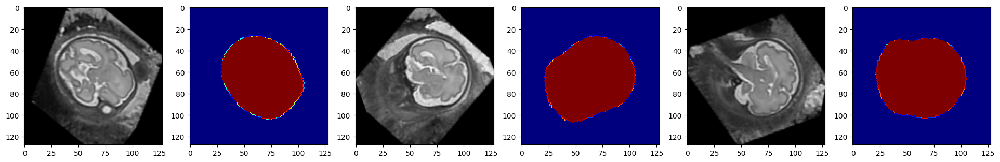

32 265-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


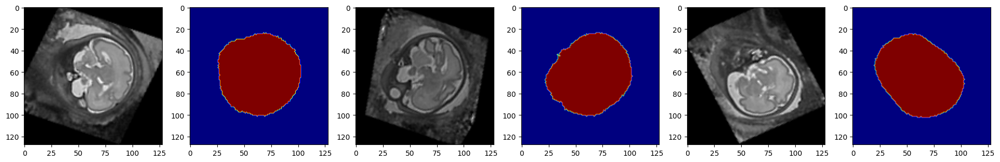

33 272-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


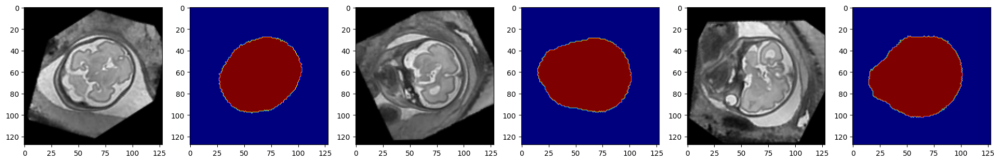

34 275-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


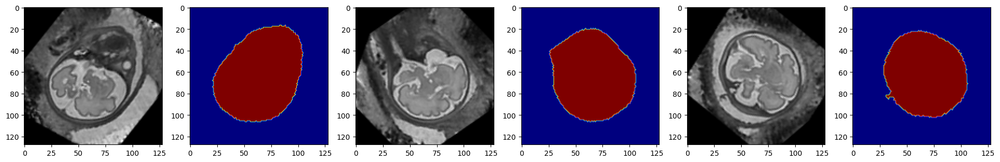

35 278-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


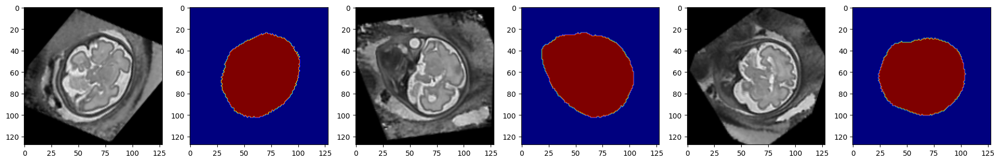

36 279-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


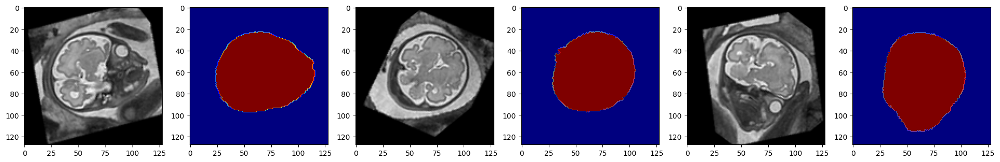

37 290-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


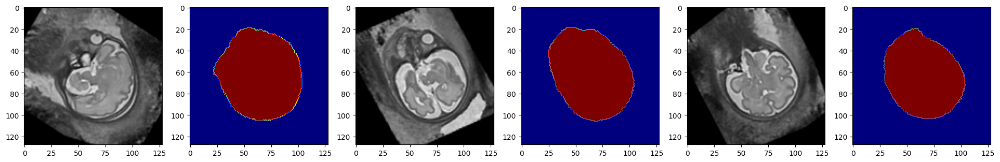

38 292-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


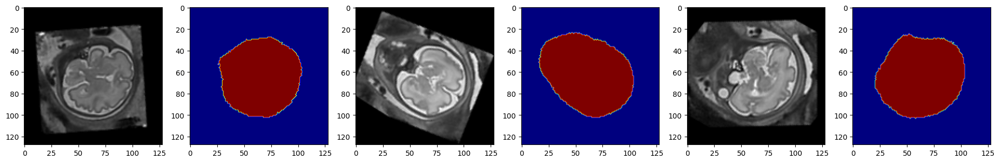

39 297-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


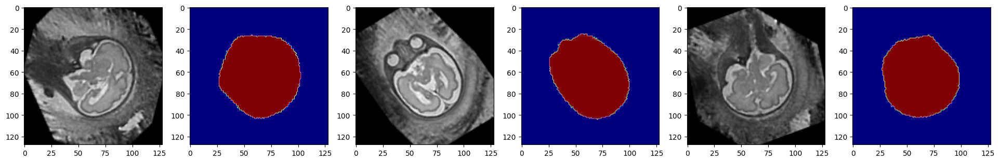

40 309-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


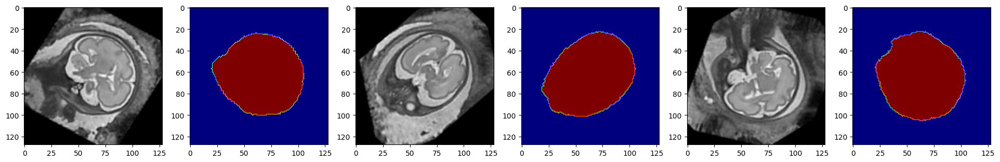

41 315-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


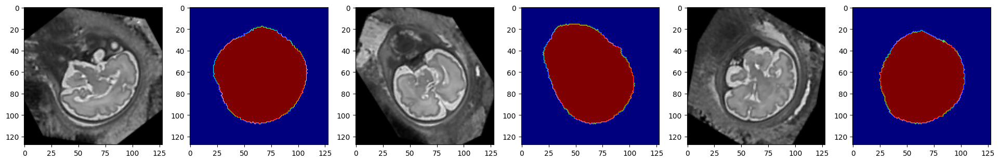

42 334-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


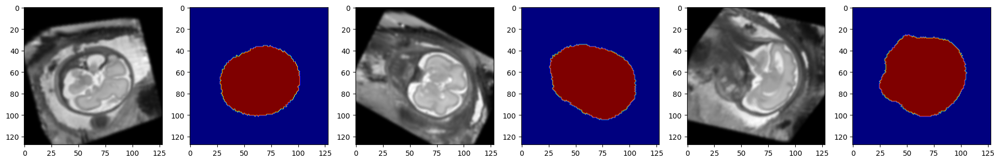

43 401-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


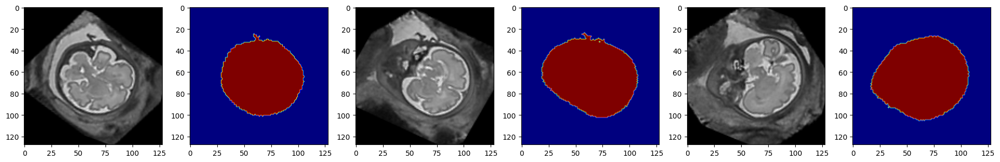

44 417-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


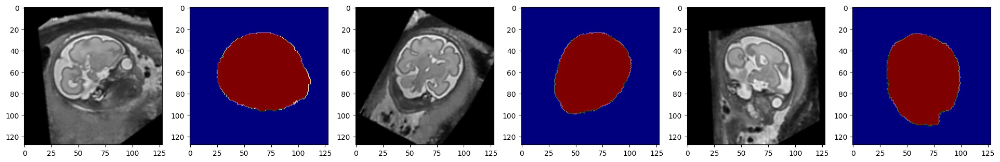

45 435-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


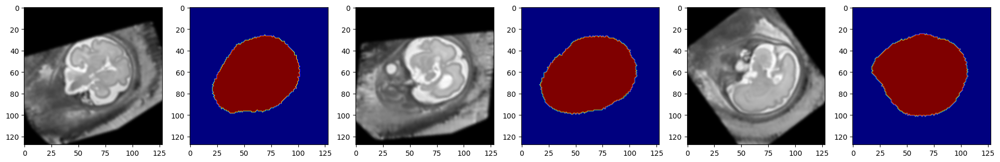

46 225-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


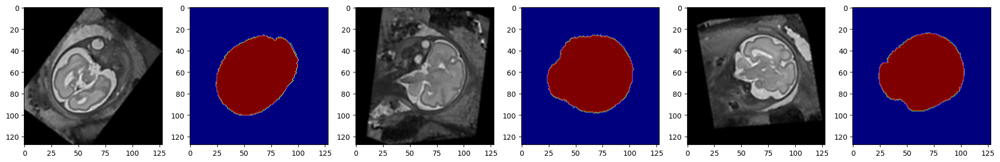

47 230-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


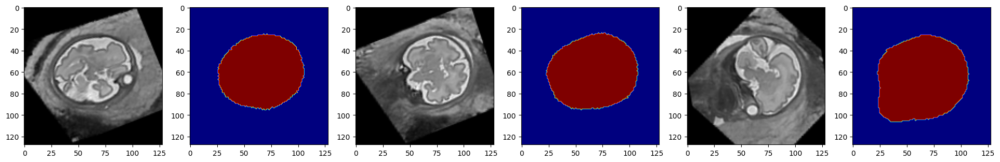

48 242-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


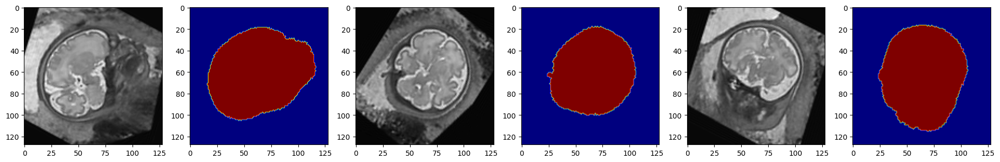

49 243-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


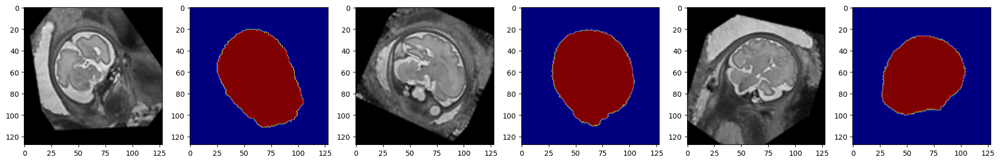

50 258-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


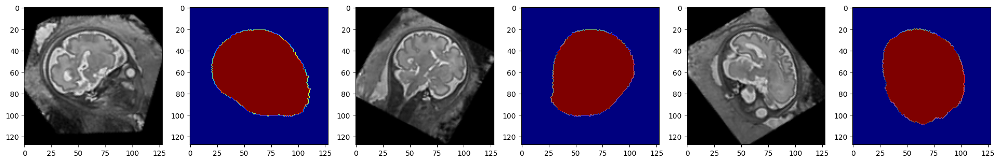

51 273-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


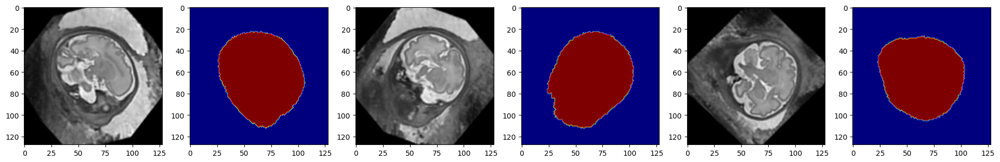

52 283-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


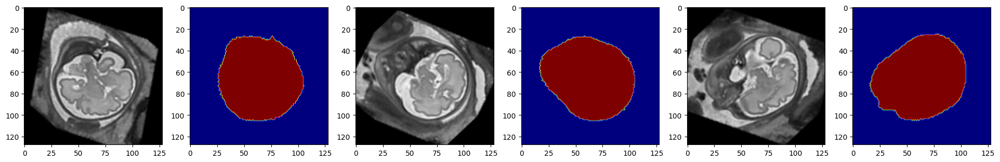

53 438-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


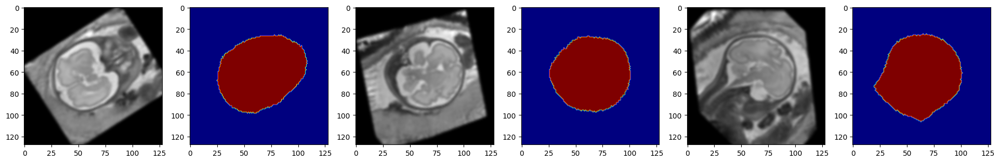

54 hist-142-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


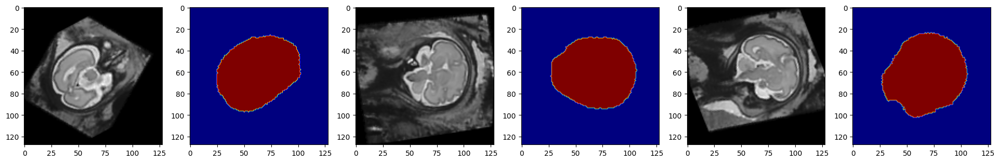

55 hist-190-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


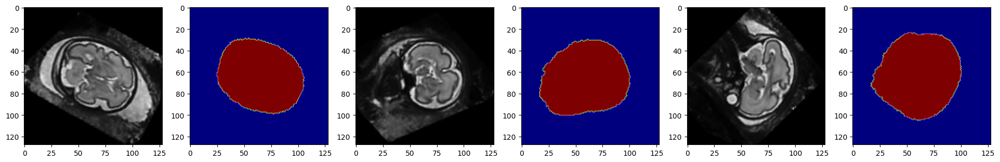

56 hist-203-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


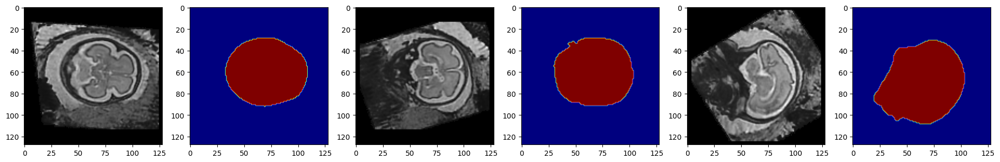

57 hist-205-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


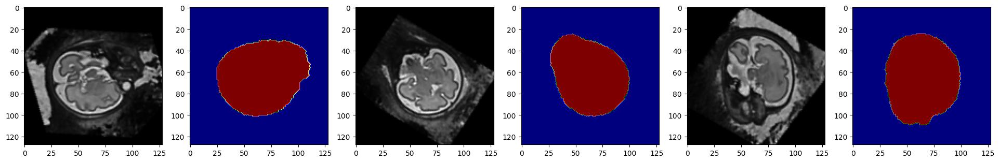

58 hist-215-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


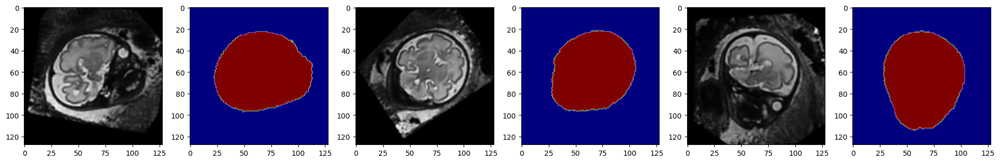

59 hist-225-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


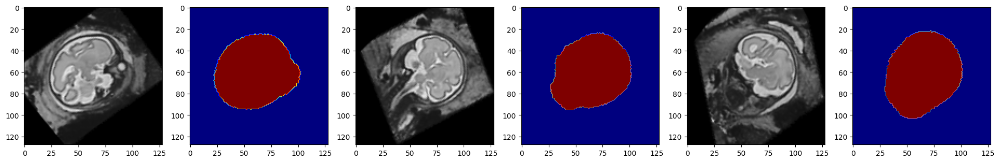

60 hist-230-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


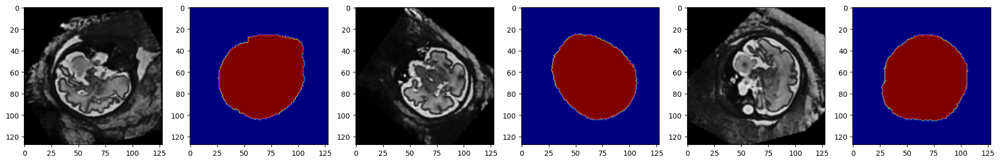

61 hist-231-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


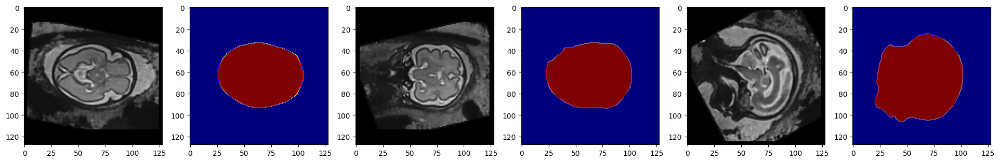

62 hist-242-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


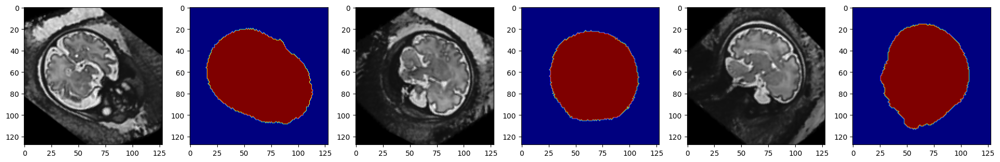

63 hist-243-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


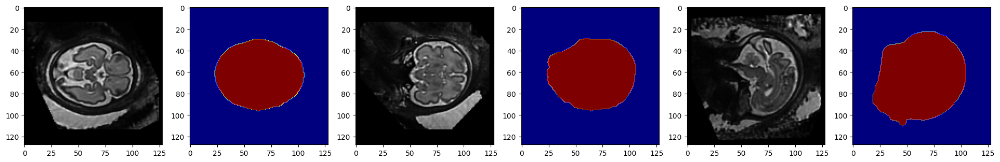

64 hist-250-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


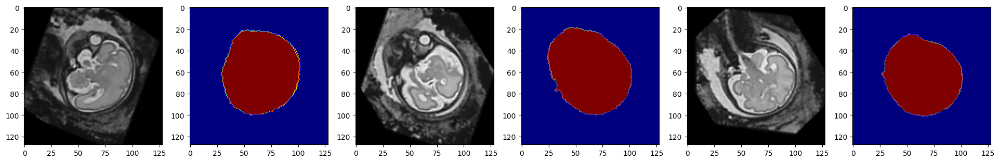

65 hist-252-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


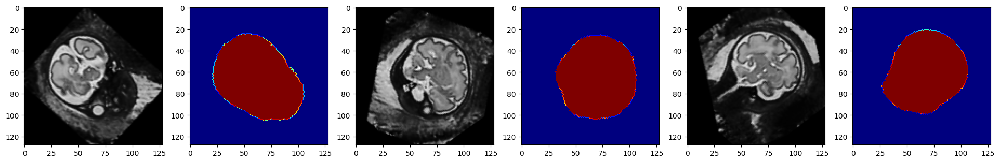

66 hist-258-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


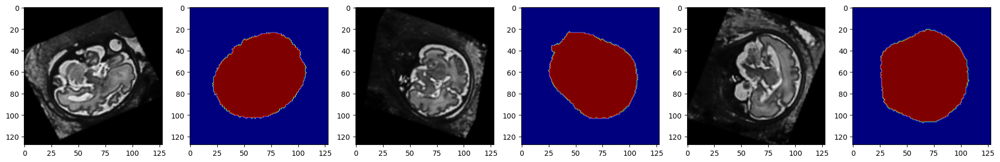

67 hist-265-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


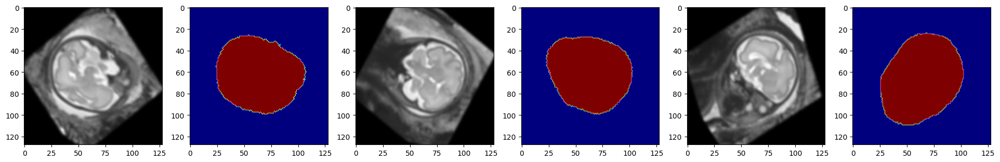

68 hist-272-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


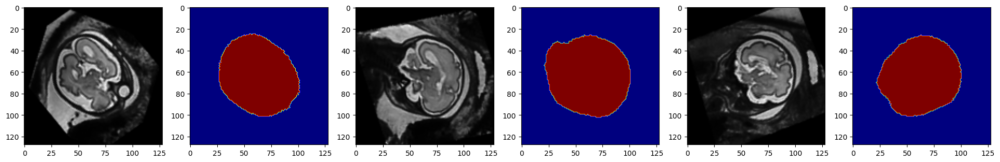

69 hist-273-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


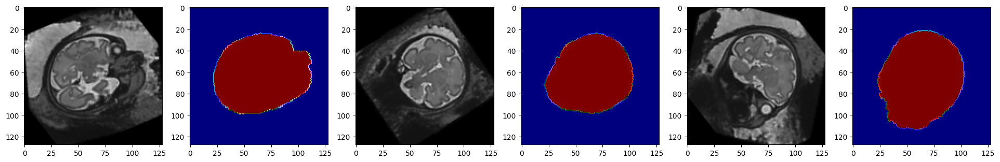

70 hist-278-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


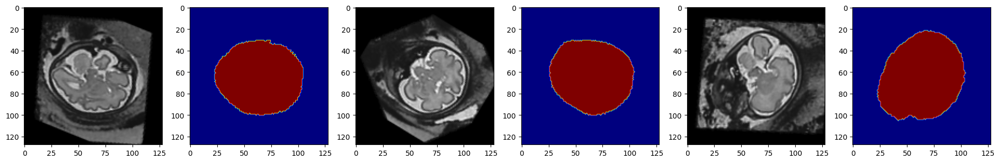

71 hist-279-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


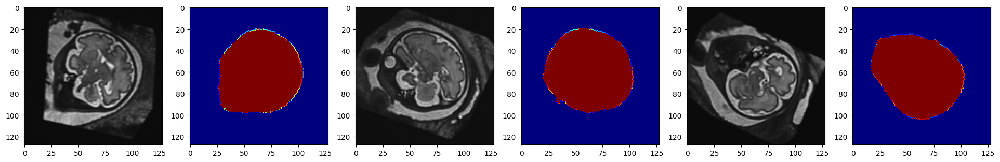

72 hist-283-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


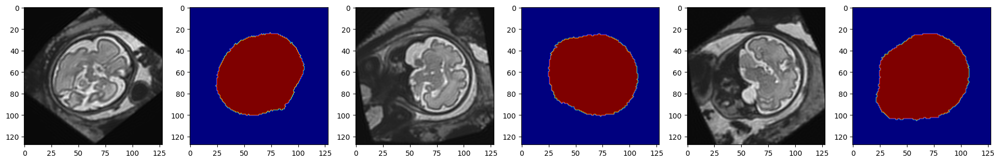

73 hist-290-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


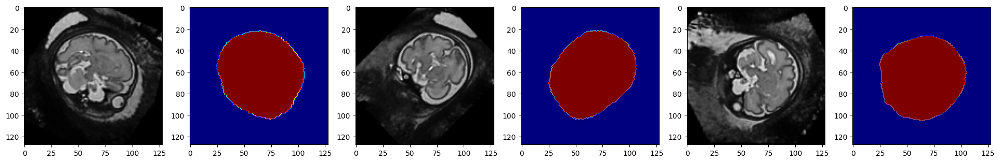

74 hist-297-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


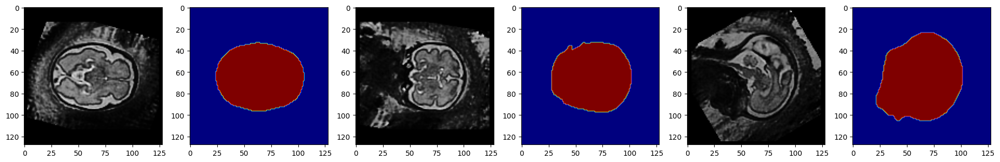

75 hist-309-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


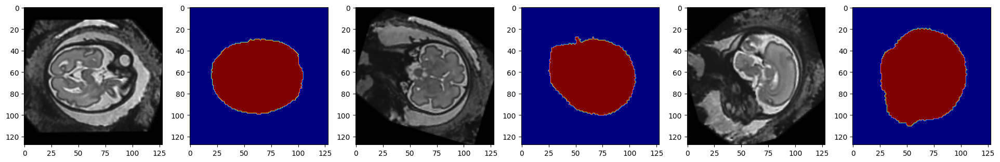

76 hist-315-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


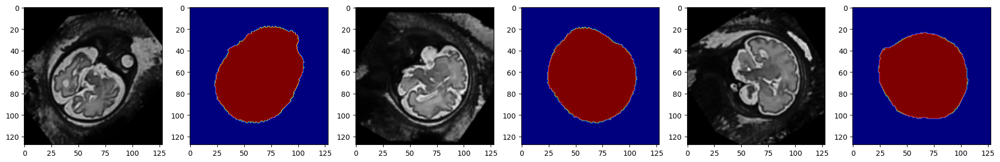

77 hist-334-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


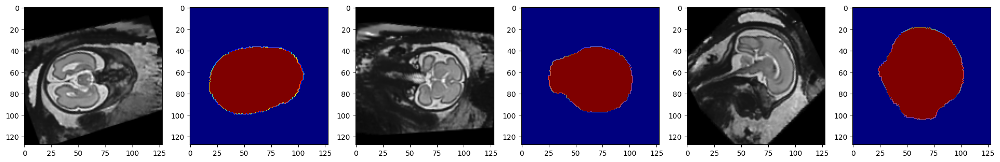

78 hist-355-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


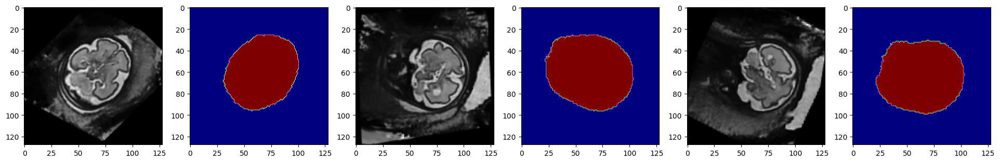

79 hist-401-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


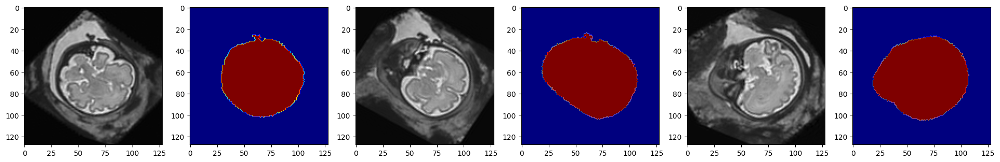

80 hist-417-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


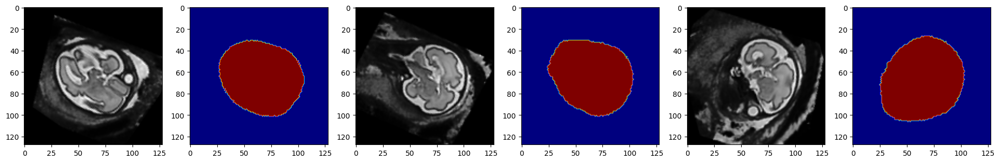

81 hist-438-img.nii.gz torch.Size([1, 128, 128, 128]) torch.Size([1, 128, 128, 128])


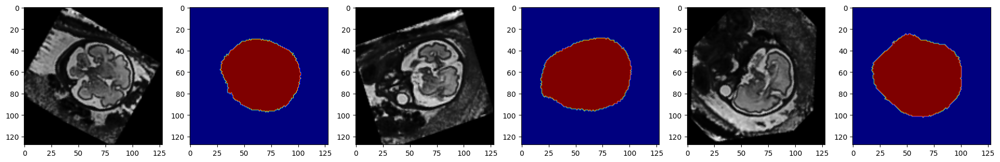

In [ ]:
print("Training Set")
s = round(img_dim / 2)

for x in range(len(train_ds)):
    sample = train_ds[x]
    img = sample["image"]
    label = sample["label"]

    img = sample["image"]
    label = sample["label"]
    case_name = os.path.split(sample["image_meta_dict"]["filename_or_obj"])[1]
    img_shape = img.shape
    label_shape = label.shape

    print(x, case_name, img_shape, label_shape)

    # print(x, case_name, img_shape, label_shape)
    plt.figure("image", (24, 4))
    plt.subplot(1, 6, 1)
    plt.imshow(img[0, :, :, s], cmap="gray")
    plt.subplot(1, 6, 2)
    plt.imshow(label[0, :, :, s], cmap="jet")
    plt.subplot(1, 6, 3)
    plt.imshow(img[0, :, s, :], cmap="gray")
    plt.subplot(1, 6, 4)
    plt.imshow(label[0, :, s, :], cmap="jet")
    plt.subplot(1, 6, 5)
    plt.imshow(img[0, s, :, :], cmap="gray")
    plt.subplot(1, 6, 6)
    plt.imshow(label[0, s, :, :], cmap="jet")
    plt.show()


In [ ]:
# define the network using MONAI
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet(spatial_dims=3,
in_channels=1,
out_channels=class_num,
channels=(32, 64, 128, 256, 512),
strides=(2,2,2,2),
kernel_size=3,
up_kernel_size=3,
num_res_units=1,
act='PRELU',
norm='INSTANCE',
dropout=0.5).to(device)

loss_function = DiceCELoss(to_onehot_y=True, softmax=True)
torch.backends.cudnn.benchmark = True
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)



In [ ]:
def validation(epoch_iterator_val):
    model.eval()
    dice_vals = list()
    with torch.no_grad():
        for step, batch in enumerate(epoch_iterator_val):
            val_inputs, val_labels = (batch["image"].cuda(), batch["label"].cuda())
            val_outputs = sliding_window_inference(val_inputs, (img_dim, img_dim, img_dim), 4, model)
            val_labels_list = decollate_batch(val_labels)
            val_labels_convert = [
                post_label(val_label_tensor) for val_label_tensor in val_labels_list
            ]
            val_outputs_list = decollate_batch(val_outputs)
            val_output_convert = [
                post_pred(val_pred_tensor) for val_pred_tensor in val_outputs_list
            ]
            dice_metric(y_pred=val_output_convert, y=val_labels_convert)
            dice = dice_metric.aggregate().item()
            dice_vals.append(dice)
            epoch_iterator_val.set_description(
                "Validate (%d / %d Steps) (dice=%2.5f)" % (global_step, 10.0, dice)
            )
        dice_metric.reset()
    mean_dice_val = np.mean(dice_vals)
    return mean_dice_val


def train(global_step, train_loader, dice_val_best, global_step_best,epochs_without_improvement):
    model.train()
    epoch_loss = 0
    step = 0
    total_training_time = 0
    patience = 10
    epoch_iterator = tqdm(
        train_loader, desc="Training (X / X Steps) (loss=X.X)", dynamic_ncols=True
    )
    # Initialize variables for early stopping
    start_time = time.time()  # Record the start time
    for step, batch in enumerate(epoch_iterator):
        step += 1
        x, y = (batch["image"].cuda(), batch["label"].cuda())
        logit_map = model(x)
        loss = loss_function(logit_map, y)
        loss.backward()
        epoch_loss += loss.item()
        optimizer.step()
        optimizer.zero_grad()
        epoch_iterator.set_description(
            "Training (%d / %d Steps) (loss=%2.5f)" % (global_step, max_iterations, loss)
        )
        # Check if early stopping condition is met
        if epochs_without_improvement >= patience:
          print("Early stopping: Model has not improved for {} epochs.".format(patience))
          epoch_iterator.close()
          epoch_iterator_val.close()
          break

        if (
            global_step % eval_num == 0 and global_step != 0
        ) or global_step == max_iterations:
            epoch_iterator_val = tqdm(
                val_loader, desc="Validate (X / X Steps) (dice=X.X)", dynamic_ncols=True
            )
            dice_val = validation(epoch_iterator_val)
            epoch_loss /= step
            #CHANGE PER MODEL
            epoch_loss_values_unetwithaug.append(epoch_loss)
            #CHANGE PER MODEL
            metric_values_unetwithaug.append(dice_val)

            if dice_val > dice_val_best:
                dice_val_best = dice_val
                global_step_best = global_step
                epochs_without_improvement = 0 # Reset patience counter
                print("Patience Counter has Been Reset")
                #CHANGE PER MODEL
                torch.save(
                    model.state_dict(), os.path.join(root_dir, (roi_type+"unet_withaug_best_metric_model.pth"))
                )
                print(
                    "Model Was Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
                print("Epochs Without Improvement:{}".format(epochs_without_improvement))

            else:
              epochs_without_improvement += 1
              #CHANGE PER MODEL
              torch.save(model.state_dict(), os.path.join(root_dir, (roi_type+"unet_withaug_latest_metric_model.pth")))
              print("Model Was Not Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(dice_val_best, dice_val))
              print("+1 Added to Patience Counter")
              print("Epochs Without Improvement:{}".format(epochs_without_improvement))



        global_step += 1

    # Training loop has completed, calculate the total training time
    end_time = time.time()
    epoch_iterator.close()

    total_training_time += end_time - start_time
    total_training_time_minutes = total_training_time / 60
    print(f"\nTotal Training Time: {total_training_time_minutes:.2f} minutes")
    print(f"Global step: {global_step}, Eval num: {eval_num}, Max iterations: {max_iterations}")
    return global_step, dice_val_best, global_step_best, epochs_without_improvement





In [ ]:
max_iterations = 30000
eval_num = 200
post_label = AsDiscrete(to_onehot=class_num)
post_pred = AsDiscrete(argmax=True, to_onehot=class_num)
dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)
global_step = 0
dice_val_best = 0.0
global_step_best = 0
epochs_without_improvement = 0
#CHANGE PER MODEL
epoch_loss_values_unetwithaug = []
#CHANGE PER MODEL
metric_values_unetwithaug = []

In [ ]:
# run training

while global_step < max_iterations:
    global_step, dice_val_best, global_step_best,epochs_without_improvement = train(
        global_step, train_loader, dice_val_best, global_step_best,epochs_without_improvement
    )

Training (81 / 30000 Steps) (loss=1.09799): 100%|██████████| 82/82 [00:34<00:00,  2.39it/s]



Total Training Time: 0.57 minutes
Global step: 82, Eval num: 200, Max iterations: 30000


Training (163 / 30000 Steps) (loss=0.88588): 100%|██████████| 82/82 [00:16<00:00,  4.87it/s]



Total Training Time: 0.28 minutes
Global step: 164, Eval num: 200, Max iterations: 30000


Validate (164 / 10 Steps) (dice=0.82803): 100%|██████████| 12/12 [00:02<00:00,  5.71it/s]


Patience Counter has Been Reset


Training (201 / 30000 Steps) (loss=0.83194):  46%|████▋     | 38/82 [00:11<00:38,  1.15it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8038382430871328 Current Avg. Dice: 0.8038382430871328
Epochs Without Improvement:0


Training (245 / 30000 Steps) (loss=0.65534): 100%|██████████| 82/82 [00:19<00:00,  4.17it/s]



Total Training Time: 0.33 minutes
Global step: 246, Eval num: 200, Max iterations: 30000


Training (327 / 30000 Steps) (loss=0.58740): 100%|██████████| 82/82 [00:16<00:00,  4.87it/s]



Total Training Time: 0.28 minutes
Global step: 328, Eval num: 200, Max iterations: 30000


Training (400 / 30000 Steps) (loss=0.56224):  89%|████████▉ | 73/82 [00:17<00:07,  1.21it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.8550134152173996 Current Avg. Dice: 0.8550134152173996
Epochs Without Improvement:0


Training (409 / 30000 Steps) (loss=0.52593): 100%|██████████| 82/82 [00:19<00:00,  4.29it/s]



Total Training Time: 0.32 minutes
Global step: 410, Eval num: 200, Max iterations: 30000


Training (491 / 30000 Steps) (loss=0.51656): 100%|██████████| 82/82 [00:17<00:00,  4.82it/s]



Total Training Time: 0.28 minutes
Global step: 492, Eval num: 200, Max iterations: 30000


Training (573 / 30000 Steps) (loss=0.47910): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 574, Eval num: 200, Max iterations: 30000


Training (600 / 30000 Steps) (loss=0.46314):  33%|███▎      | 27/82 [00:08<00:52,  1.04it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.8718672941128413 Current Avg. Dice: 0.8718672941128413
Epochs Without Improvement:0


Training (655 / 30000 Steps) (loss=0.63510): 100%|██████████| 82/82 [00:19<00:00,  4.29it/s]



Total Training Time: 0.32 minutes
Global step: 656, Eval num: 200, Max iterations: 30000


Training (737 / 30000 Steps) (loss=0.37975): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 738, Eval num: 200, Max iterations: 30000


Training (800 / 30000 Steps) (loss=0.36599):  77%|███████▋  | 63/82 [00:15<00:16,  1.17it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.8774782617886862 Current Avg. Dice: 0.8774782617886862
Epochs Without Improvement:0


Training (819 / 30000 Steps) (loss=0.27001): 100%|██████████| 82/82 [00:19<00:00,  4.30it/s]



Total Training Time: 0.32 minutes
Global step: 820, Eval num: 200, Max iterations: 30000


Training (901 / 30000 Steps) (loss=0.26549): 100%|██████████| 82/82 [00:16<00:00,  4.87it/s]



Total Training Time: 0.28 minutes
Global step: 902, Eval num: 200, Max iterations: 30000


Training (983 / 30000 Steps) (loss=0.27491): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 984, Eval num: 200, Max iterations: 30000


Training (1000 / 30000 Steps) (loss=0.54569):  21%|██        | 17/82 [00:06<01:02,  1.04it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9157892167568207 Current Avg. Dice: 0.9157892167568207
Epochs Without Improvement:0


Training (1065 / 30000 Steps) (loss=0.17073): 100%|██████████| 82/82 [00:19<00:00,  4.21it/s]



Total Training Time: 0.32 minutes
Global step: 1066, Eval num: 200, Max iterations: 30000


Training (1147 / 30000 Steps) (loss=0.28915): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 1148, Eval num: 200, Max iterations: 30000


Training (1201 / 30000 Steps) (loss=0.20369):  66%|██████▌   | 54/82 [00:14<00:23,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9157892167568207 Current Avg. Dice: 0.9083163142204285
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (1229 / 30000 Steps) (loss=0.29891): 100%|██████████| 82/82 [00:20<00:00,  4.09it/s]



Total Training Time: 0.33 minutes
Global step: 1230, Eval num: 200, Max iterations: 30000


Training (1311 / 30000 Steps) (loss=0.17044): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 1312, Eval num: 200, Max iterations: 30000


Training (1393 / 30000 Steps) (loss=0.20301): 100%|██████████| 82/82 [00:17<00:00,  4.79it/s]



Total Training Time: 0.29 minutes
Global step: 1394, Eval num: 200, Max iterations: 30000


Training (1400 / 30000 Steps) (loss=0.26496):   9%|▊         | 7/82 [00:04<01:14,  1.01it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9228648940722147 Current Avg. Dice: 0.9228648940722147
Epochs Without Improvement:0


Training (1475 / 30000 Steps) (loss=0.12904): 100%|██████████| 82/82 [00:19<00:00,  4.21it/s]



Total Training Time: 0.32 minutes
Global step: 1476, Eval num: 200, Max iterations: 30000


Training (1557 / 30000 Steps) (loss=0.19510): 100%|██████████| 82/82 [00:17<00:00,  4.79it/s]



Total Training Time: 0.29 minutes
Global step: 1558, Eval num: 200, Max iterations: 30000


Training (1600 / 30000 Steps) (loss=0.33921):  52%|█████▏    | 43/82 [00:11<00:33,  1.17it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9314602315425873 Current Avg. Dice: 0.9314602315425873
Epochs Without Improvement:0


Training (1639 / 30000 Steps) (loss=0.24929): 100%|██████████| 82/82 [00:18<00:00,  4.35it/s]



Total Training Time: 0.31 minutes
Global step: 1640, Eval num: 200, Max iterations: 30000


Training (1721 / 30000 Steps) (loss=0.13211): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 1722, Eval num: 200, Max iterations: 30000


Training (1800 / 30000 Steps) (loss=0.16208):  96%|█████████▋| 79/82 [00:18<00:02,  1.42it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9364881267150243 Current Avg. Dice: 0.9364881267150243
Epochs Without Improvement:0


Training (1803 / 30000 Steps) (loss=0.19505): 100%|██████████| 82/82 [00:19<00:00,  4.30it/s]



Total Training Time: 0.32 minutes
Global step: 1804, Eval num: 200, Max iterations: 30000


Training (1885 / 30000 Steps) (loss=0.19323): 100%|██████████| 82/82 [00:17<00:00,  4.72it/s]



Total Training Time: 0.29 minutes
Global step: 1886, Eval num: 200, Max iterations: 30000


Training (1967 / 30000 Steps) (loss=0.13747): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 1968, Eval num: 200, Max iterations: 30000


Training (2001 / 30000 Steps) (loss=0.11352):  41%|████▏     | 34/82 [00:09<00:30,  1.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9364881267150243 Current Avg. Dice: 0.9287287096182505
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (2049 / 30000 Steps) (loss=0.09034): 100%|██████████| 82/82 [00:18<00:00,  4.33it/s]



Total Training Time: 0.32 minutes
Global step: 2050, Eval num: 200, Max iterations: 30000


Training (2131 / 30000 Steps) (loss=0.25224): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 2132, Eval num: 200, Max iterations: 30000


Training (2200 / 30000 Steps) (loss=0.16366):  84%|████████▍ | 69/82 [00:17<00:10,  1.22it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9422533810138702 Current Avg. Dice: 0.9422533810138702
Epochs Without Improvement:0


Training (2213 / 30000 Steps) (loss=0.17527): 100%|██████████| 82/82 [00:19<00:00,  4.29it/s]



Total Training Time: 0.32 minutes
Global step: 2214, Eval num: 200, Max iterations: 30000


Training (2295 / 30000 Steps) (loss=0.18726): 100%|██████████| 82/82 [00:17<00:00,  4.78it/s]



Total Training Time: 0.29 minutes
Global step: 2296, Eval num: 200, Max iterations: 30000


Training (2377 / 30000 Steps) (loss=0.14841): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 2378, Eval num: 200, Max iterations: 30000


Training (2401 / 30000 Steps) (loss=0.15942):  29%|██▉       | 24/82 [00:07<00:36,  1.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9422533810138702 Current Avg. Dice: 0.9288243105014166
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (2459 / 30000 Steps) (loss=0.28760): 100%|██████████| 82/82 [00:18<00:00,  4.42it/s]



Total Training Time: 0.31 minutes
Global step: 2460, Eval num: 200, Max iterations: 30000


Training (2541 / 30000 Steps) (loss=0.10571): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 2542, Eval num: 200, Max iterations: 30000


Training (2600 / 30000 Steps) (loss=0.17849):  72%|███████▏  | 59/82 [00:15<00:19,  1.18it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9428912301858267 Current Avg. Dice: 0.9428912301858267
Epochs Without Improvement:0


Training (2623 / 30000 Steps) (loss=0.08548): 100%|██████████| 82/82 [00:19<00:00,  4.17it/s]



Total Training Time: 0.33 minutes
Global step: 2624, Eval num: 200, Max iterations: 30000


Training (2705 / 30000 Steps) (loss=0.14046): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 2706, Eval num: 200, Max iterations: 30000


Training (2787 / 30000 Steps) (loss=0.11480): 100%|██████████| 82/82 [00:16<00:00,  4.87it/s]



Total Training Time: 0.28 minutes
Global step: 2788, Eval num: 200, Max iterations: 30000


Training (2800 / 30000 Steps) (loss=0.16284):  16%|█▌        | 13/82 [00:05<00:58,  1.18it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9485008418560028 Current Avg. Dice: 0.9485008418560028
Epochs Without Improvement:0


Training (2869 / 30000 Steps) (loss=0.11058): 100%|██████████| 82/82 [00:18<00:00,  4.34it/s]



Total Training Time: 0.31 minutes
Global step: 2870, Eval num: 200, Max iterations: 30000


Training (2951 / 30000 Steps) (loss=0.15702): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 2952, Eval num: 200, Max iterations: 30000


Training (3000 / 30000 Steps) (loss=0.16857):  60%|█████▉    | 49/82 [00:12<00:26,  1.24it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9487357238928477 Current Avg. Dice: 0.9487357238928477
Epochs Without Improvement:0


Training (3033 / 30000 Steps) (loss=0.10371): 100%|██████████| 82/82 [00:18<00:00,  4.39it/s]



Total Training Time: 0.31 minutes
Global step: 3034, Eval num: 200, Max iterations: 30000


Training (3115 / 30000 Steps) (loss=0.08799): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 3116, Eval num: 200, Max iterations: 30000


Training (3197 / 30000 Steps) (loss=0.10024): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 3198, Eval num: 200, Max iterations: 30000


Training (3200 / 30000 Steps) (loss=0.08938):   4%|▎         | 3/82 [00:03<01:45,  1.34s/it]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9533887654542923 Current Avg. Dice: 0.9533887654542923
Epochs Without Improvement:0


Training (3279 / 30000 Steps) (loss=0.05530): 100%|██████████| 82/82 [00:18<00:00,  4.40it/s]



Total Training Time: 0.31 minutes
Global step: 3280, Eval num: 200, Max iterations: 30000


Training (3361 / 30000 Steps) (loss=0.09588): 100%|██████████| 82/82 [00:17<00:00,  4.69it/s]



Total Training Time: 0.29 minutes
Global step: 3362, Eval num: 200, Max iterations: 30000


Training (3400 / 30000 Steps) (loss=0.08132):  48%|████▊     | 39/82 [00:10<00:34,  1.24it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9535251061121622 Current Avg. Dice: 0.9535251061121622
Epochs Without Improvement:0


Training (3443 / 30000 Steps) (loss=0.06388): 100%|██████████| 82/82 [00:18<00:00,  4.42it/s]



Total Training Time: 0.31 minutes
Global step: 3444, Eval num: 200, Max iterations: 30000


Training (3525 / 30000 Steps) (loss=0.16238): 100%|██████████| 82/82 [00:17<00:00,  4.70it/s]



Total Training Time: 0.29 minutes
Global step: 3526, Eval num: 200, Max iterations: 30000


Training (3601 / 30000 Steps) (loss=0.07338):  93%|█████████▎| 76/82 [00:17<00:03,  1.68it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9535251061121622 Current Avg. Dice: 0.9513965596755346
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (3607 / 30000 Steps) (loss=0.08252): 100%|██████████| 82/82 [00:18<00:00,  4.36it/s]



Total Training Time: 0.31 minutes
Global step: 3608, Eval num: 200, Max iterations: 30000


Training (3689 / 30000 Steps) (loss=0.05736): 100%|██████████| 82/82 [00:17<00:00,  4.61it/s]



Total Training Time: 0.30 minutes
Global step: 3690, Eval num: 200, Max iterations: 30000


Training (3771 / 30000 Steps) (loss=0.11675): 100%|██████████| 82/82 [00:17<00:00,  4.65it/s]



Total Training Time: 0.29 minutes
Global step: 3772, Eval num: 200, Max iterations: 30000


Training (3800 / 30000 Steps) (loss=0.13892):  35%|███▌      | 29/82 [00:08<00:44,  1.20it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9592083593209585 Current Avg. Dice: 0.9592083593209585
Epochs Without Improvement:0


Training (3853 / 30000 Steps) (loss=0.06359): 100%|██████████| 82/82 [00:18<00:00,  4.46it/s]



Total Training Time: 0.31 minutes
Global step: 3854, Eval num: 200, Max iterations: 30000


Training (3935 / 30000 Steps) (loss=0.08087): 100%|██████████| 82/82 [00:17<00:00,  4.78it/s]



Total Training Time: 0.29 minutes
Global step: 3936, Eval num: 200, Max iterations: 30000


Training (4001 / 30000 Steps) (loss=0.05701):  80%|████████  | 66/82 [00:16<00:10,  1.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9592083593209585 Current Avg. Dice: 0.9573334008455276
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (4017 / 30000 Steps) (loss=0.06142): 100%|██████████| 82/82 [00:18<00:00,  4.36it/s]



Total Training Time: 0.31 minutes
Global step: 4018, Eval num: 200, Max iterations: 30000


Training (4099 / 30000 Steps) (loss=0.05735): 100%|██████████| 82/82 [00:17<00:00,  4.65it/s]



Total Training Time: 0.29 minutes
Global step: 4100, Eval num: 200, Max iterations: 30000


Training (4181 / 30000 Steps) (loss=0.11926): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 4182, Eval num: 200, Max iterations: 30000


Training (4201 / 30000 Steps) (loss=0.05564):  24%|██▍       | 20/82 [00:06<00:37,  1.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9592083593209585 Current Avg. Dice: 0.9585557878017426
+1 Added to Patience Counter
Epochs Without Improvement:2


Training (4263 / 30000 Steps) (loss=0.04719): 100%|██████████| 82/82 [00:18<00:00,  4.45it/s]



Total Training Time: 0.31 minutes
Global step: 4264, Eval num: 200, Max iterations: 30000


Training (4345 / 30000 Steps) (loss=0.07095): 100%|██████████| 82/82 [00:17<00:00,  4.82it/s]



Total Training Time: 0.28 minutes
Global step: 4346, Eval num: 200, Max iterations: 30000


Training (4400 / 30000 Steps) (loss=0.09925):  67%|██████▋   | 55/82 [00:13<00:21,  1.26it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9693592488765717 Current Avg. Dice: 0.9693592488765717
Epochs Without Improvement:0


Training (4427 / 30000 Steps) (loss=0.08690): 100%|██████████| 82/82 [00:18<00:00,  4.36it/s]



Total Training Time: 0.31 minutes
Global step: 4428, Eval num: 200, Max iterations: 30000


Training (4509 / 30000 Steps) (loss=0.13598): 100%|██████████| 82/82 [00:17<00:00,  4.57it/s]



Total Training Time: 0.30 minutes
Global step: 4510, Eval num: 200, Max iterations: 30000


Training (4591 / 30000 Steps) (loss=0.08939): 100%|██████████| 82/82 [00:16<00:00,  4.84it/s]



Total Training Time: 0.28 minutes
Global step: 4592, Eval num: 200, Max iterations: 30000


Training (4601 / 30000 Steps) (loss=0.04582):  12%|█▏        | 10/82 [00:05<00:46,  1.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9693592488765717 Current Avg. Dice: 0.9666003386179606
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (4673 / 30000 Steps) (loss=0.05659): 100%|██████████| 82/82 [00:18<00:00,  4.35it/s]



Total Training Time: 0.31 minutes
Global step: 4674, Eval num: 200, Max iterations: 30000


Training (4755 / 30000 Steps) (loss=0.12521): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 4756, Eval num: 200, Max iterations: 30000


Training (4800 / 30000 Steps) (loss=0.09123):  55%|█████▍    | 45/82 [00:12<00:30,  1.22it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9698810776074728 Current Avg. Dice: 0.9698810776074728
Epochs Without Improvement:0


Training (4837 / 30000 Steps) (loss=0.05681): 100%|██████████| 82/82 [00:19<00:00,  4.24it/s]



Total Training Time: 0.32 minutes
Global step: 4838, Eval num: 200, Max iterations: 30000


Training (4919 / 30000 Steps) (loss=0.05294): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 4920, Eval num: 200, Max iterations: 30000


Training (5001 / 30000 Steps) (loss=0.07444): 100%|██████████| 82/82 [00:18<00:00,  1.99it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9698810776074728 Current Avg. Dice: 0.9684929003318151
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (5001 / 30000 Steps) (loss=0.07444): 100%|██████████| 82/82 [00:18<00:00,  4.37it/s]



Total Training Time: 0.31 minutes
Global step: 5002, Eval num: 200, Max iterations: 30000


Training (5083 / 30000 Steps) (loss=0.06076): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 5084, Eval num: 200, Max iterations: 30000


Training (5165 / 30000 Steps) (loss=0.06320): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 5166, Eval num: 200, Max iterations: 30000


Training (5200 / 30000 Steps) (loss=0.06314):  43%|████▎     | 35/82 [00:09<00:39,  1.18it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9733143498500189 Current Avg. Dice: 0.9733143498500189
Epochs Without Improvement:0


Training (5247 / 30000 Steps) (loss=0.04766): 100%|██████████| 82/82 [00:19<00:00,  4.29it/s]



Total Training Time: 0.32 minutes
Global step: 5248, Eval num: 200, Max iterations: 30000


Training (5329 / 30000 Steps) (loss=0.10839): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 5330, Eval num: 200, Max iterations: 30000


Training (5401 / 30000 Steps) (loss=0.06715):  88%|████████▊ | 72/82 [00:17<00:06,  1.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9733143498500189 Current Avg. Dice: 0.968392034371694
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (5411 / 30000 Steps) (loss=0.11735): 100%|██████████| 82/82 [00:18<00:00,  4.35it/s]



Total Training Time: 0.31 minutes
Global step: 5412, Eval num: 200, Max iterations: 30000


Training (5493 / 30000 Steps) (loss=0.05789): 100%|██████████| 82/82 [00:17<00:00,  4.81it/s]



Total Training Time: 0.28 minutes
Global step: 5494, Eval num: 200, Max iterations: 30000


Training (5575 / 30000 Steps) (loss=0.08803): 100%|██████████| 82/82 [00:17<00:00,  4.72it/s]



Total Training Time: 0.29 minutes
Global step: 5576, Eval num: 200, Max iterations: 30000


Training (5600 / 30000 Steps) (loss=0.07087):  30%|███       | 25/82 [00:08<00:52,  1.08it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9742549856503805 Current Avg. Dice: 0.9742549856503805
Epochs Without Improvement:0


Training (5657 / 30000 Steps) (loss=0.04743): 100%|██████████| 82/82 [00:18<00:00,  4.34it/s]



Total Training Time: 0.31 minutes
Global step: 5658, Eval num: 200, Max iterations: 30000


Training (5739 / 30000 Steps) (loss=0.06212): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 5740, Eval num: 200, Max iterations: 30000


Training (5801 / 30000 Steps) (loss=0.05109):  76%|███████▌  | 62/82 [00:15<00:12,  1.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9742549856503805 Current Avg. Dice: 0.9705199003219604
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (5821 / 30000 Steps) (loss=0.05355): 100%|██████████| 82/82 [00:18<00:00,  4.43it/s]



Total Training Time: 0.31 minutes
Global step: 5822, Eval num: 200, Max iterations: 30000


Training (5903 / 30000 Steps) (loss=0.15748): 100%|██████████| 82/82 [00:17<00:00,  4.78it/s]



Total Training Time: 0.29 minutes
Global step: 5904, Eval num: 200, Max iterations: 30000


Training (5985 / 30000 Steps) (loss=0.04384): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 5986, Eval num: 200, Max iterations: 30000


Training (6001 / 30000 Steps) (loss=0.05081):  20%|█▉        | 16/82 [00:06<00:46,  1.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9742549856503805 Current Avg. Dice: 0.9721580843130747
+1 Added to Patience Counter
Epochs Without Improvement:2


Training (6067 / 30000 Steps) (loss=0.03861): 100%|██████████| 82/82 [00:19<00:00,  4.22it/s]



Total Training Time: 0.32 minutes
Global step: 6068, Eval num: 200, Max iterations: 30000


Training (6149 / 30000 Steps) (loss=0.05111): 100%|██████████| 82/82 [00:17<00:00,  4.78it/s]



Total Training Time: 0.29 minutes
Global step: 6150, Eval num: 200, Max iterations: 30000


Training (6200 / 30000 Steps) (loss=0.12590):  62%|██████▏   | 51/82 [00:13<00:25,  1.21it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9751582940419515 Current Avg. Dice: 0.9751582940419515
Epochs Without Improvement:0


Training (6231 / 30000 Steps) (loss=0.05760): 100%|██████████| 82/82 [00:19<00:00,  4.31it/s]



Total Training Time: 0.32 minutes
Global step: 6232, Eval num: 200, Max iterations: 30000


Training (6313 / 30000 Steps) (loss=0.03886): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 6314, Eval num: 200, Max iterations: 30000


Training (6395 / 30000 Steps) (loss=0.04644): 100%|██████████| 82/82 [00:17<00:00,  4.80it/s]



Total Training Time: 0.28 minutes
Global step: 6396, Eval num: 200, Max iterations: 30000


Training (6401 / 30000 Steps) (loss=0.04550):   7%|▋         | 6/82 [00:05<01:01,  1.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9751582940419515 Current Avg. Dice: 0.9724946568409601
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (6477 / 30000 Steps) (loss=0.03153): 100%|██████████| 82/82 [00:19<00:00,  4.14it/s]



Total Training Time: 0.33 minutes
Global step: 6478, Eval num: 200, Max iterations: 30000


Training (6559 / 30000 Steps) (loss=0.06500): 100%|██████████| 82/82 [00:17<00:00,  4.72it/s]



Total Training Time: 0.29 minutes
Global step: 6560, Eval num: 200, Max iterations: 30000


Training (6601 / 30000 Steps) (loss=0.08505):  51%|█████     | 42/82 [00:11<00:24,  1.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9751582940419515 Current Avg. Dice: 0.9739188055197397
+1 Added to Patience Counter
Epochs Without Improvement:2


Training (6641 / 30000 Steps) (loss=0.03804): 100%|██████████| 82/82 [00:18<00:00,  4.37it/s]



Total Training Time: 0.31 minutes
Global step: 6642, Eval num: 200, Max iterations: 30000


Training (6723 / 30000 Steps) (loss=0.05060): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 6724, Eval num: 200, Max iterations: 30000


Training (6800 / 30000 Steps) (loss=0.04639):  94%|█████████▍| 77/82 [00:18<00:03,  1.33it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.975264718135198 Current Avg. Dice: 0.975264718135198
Epochs Without Improvement:0


Training (6805 / 30000 Steps) (loss=0.03117): 100%|██████████| 82/82 [00:19<00:00,  4.26it/s]



Total Training Time: 0.32 minutes
Global step: 6806, Eval num: 200, Max iterations: 30000


Training (6887 / 30000 Steps) (loss=0.06686): 100%|██████████| 82/82 [00:17<00:00,  4.70it/s]



Total Training Time: 0.29 minutes
Global step: 6888, Eval num: 200, Max iterations: 30000


Training (6969 / 30000 Steps) (loss=0.05683): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 6970, Eval num: 200, Max iterations: 30000


Training (7001 / 30000 Steps) (loss=0.04461):  39%|███▉      | 32/82 [00:09<00:31,  1.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.975264718135198 Current Avg. Dice: 0.9739733984073004
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (7051 / 30000 Steps) (loss=0.05860): 100%|██████████| 82/82 [00:18<00:00,  4.40it/s]



Total Training Time: 0.31 minutes
Global step: 7052, Eval num: 200, Max iterations: 30000


Training (7133 / 30000 Steps) (loss=0.04464): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 7134, Eval num: 200, Max iterations: 30000


Training (7200 / 30000 Steps) (loss=0.03969):  82%|████████▏ | 67/82 [00:16<00:12,  1.21it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9758475224177042 Current Avg. Dice: 0.9758475224177042
Epochs Without Improvement:0


Training (7215 / 30000 Steps) (loss=0.05157): 100%|██████████| 82/82 [00:19<00:00,  4.28it/s]



Total Training Time: 0.32 minutes
Global step: 7216, Eval num: 200, Max iterations: 30000


Training (7297 / 30000 Steps) (loss=0.07385): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 7298, Eval num: 200, Max iterations: 30000


Training (7379 / 30000 Steps) (loss=0.03874): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 7380, Eval num: 200, Max iterations: 30000


Training (7400 / 30000 Steps) (loss=0.06173):  26%|██▌       | 21/82 [00:07<00:50,  1.20it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9780927101771036 Current Avg. Dice: 0.9780927101771036
Epochs Without Improvement:0


Training (7461 / 30000 Steps) (loss=0.04402): 100%|██████████| 82/82 [00:18<00:00,  4.40it/s]



Total Training Time: 0.31 minutes
Global step: 7462, Eval num: 200, Max iterations: 30000


Training (7543 / 30000 Steps) (loss=0.04291): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 7544, Eval num: 200, Max iterations: 30000


Training (7601 / 30000 Steps) (loss=0.05418):  71%|███████   | 58/82 [00:14<00:15,  1.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9780927101771036 Current Avg. Dice: 0.975293293595314
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (7625 / 30000 Steps) (loss=0.03548): 100%|██████████| 82/82 [00:19<00:00,  4.25it/s]



Total Training Time: 0.32 minutes
Global step: 7626, Eval num: 200, Max iterations: 30000


Training (7707 / 30000 Steps) (loss=0.08357): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 7708, Eval num: 200, Max iterations: 30000


Training (7789 / 30000 Steps) (loss=0.04057): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 7790, Eval num: 200, Max iterations: 30000


Training (7801 / 30000 Steps) (loss=0.05754):  15%|█▍        | 12/82 [00:05<00:43,  1.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9780927101771036 Current Avg. Dice: 0.9776426404714584
+1 Added to Patience Counter
Epochs Without Improvement:2


Training (7871 / 30000 Steps) (loss=0.04715): 100%|██████████| 82/82 [00:18<00:00,  4.35it/s]



Total Training Time: 0.31 minutes
Global step: 7872, Eval num: 200, Max iterations: 30000


Training (7953 / 30000 Steps) (loss=0.06947): 100%|██████████| 82/82 [00:17<00:00,  4.73it/s]



Total Training Time: 0.29 minutes
Global step: 7954, Eval num: 200, Max iterations: 30000


Training (8001 / 30000 Steps) (loss=0.04713):  59%|█████▊    | 48/82 [00:13<00:20,  1.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9780927101771036 Current Avg. Dice: 0.9751567095518112
+1 Added to Patience Counter
Epochs Without Improvement:3


Training (8035 / 30000 Steps) (loss=0.04086): 100%|██████████| 82/82 [00:19<00:00,  4.16it/s]



Total Training Time: 0.33 minutes
Global step: 8036, Eval num: 200, Max iterations: 30000


Training (8117 / 30000 Steps) (loss=0.03733): 100%|██████████| 82/82 [00:17<00:00,  4.70it/s]



Total Training Time: 0.29 minutes
Global step: 8118, Eval num: 200, Max iterations: 30000


Training (8199 / 30000 Steps) (loss=0.05887): 100%|██████████| 82/82 [00:17<00:00,  4.71it/s]



Total Training Time: 0.29 minutes
Global step: 8200, Eval num: 200, Max iterations: 30000


Training (8201 / 30000 Steps) (loss=0.05305):   2%|▏         | 2/82 [00:03<01:55,  1.45s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.9780927101771036 Current Avg. Dice: 0.9773315340280533
+1 Added to Patience Counter
Epochs Without Improvement:4


Training (8281 / 30000 Steps) (loss=0.05347): 100%|██████████| 82/82 [00:18<00:00,  4.34it/s]



Total Training Time: 0.31 minutes
Global step: 8282, Eval num: 200, Max iterations: 30000


Training (8363 / 30000 Steps) (loss=0.04105): 100%|██████████| 82/82 [00:17<00:00,  4.68it/s]



Total Training Time: 0.29 minutes
Global step: 8364, Eval num: 200, Max iterations: 30000


Training (8401 / 30000 Steps) (loss=0.03062):  46%|████▋     | 38/82 [00:10<00:27,  1.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9780927101771036 Current Avg. Dice: 0.9771402130524317
+1 Added to Patience Counter
Epochs Without Improvement:5


Training (8445 / 30000 Steps) (loss=0.03073): 100%|██████████| 82/82 [00:19<00:00,  4.31it/s]



Total Training Time: 0.32 minutes
Global step: 8446, Eval num: 200, Max iterations: 30000


Training (8527 / 30000 Steps) (loss=0.05906): 100%|██████████| 82/82 [00:17<00:00,  4.69it/s]



Total Training Time: 0.29 minutes
Global step: 8528, Eval num: 200, Max iterations: 30000


Training (8600 / 30000 Steps) (loss=0.05403):  89%|████████▉ | 73/82 [00:17<00:07,  1.21it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9784152060747147 Current Avg. Dice: 0.9784152060747147
Epochs Without Improvement:0


Training (8609 / 30000 Steps) (loss=0.02735): 100%|██████████| 82/82 [00:18<00:00,  4.35it/s]



Total Training Time: 0.31 minutes
Global step: 8610, Eval num: 200, Max iterations: 30000


Training (8691 / 30000 Steps) (loss=0.07401): 100%|██████████| 82/82 [00:17<00:00,  4.66it/s]



Total Training Time: 0.29 minutes
Global step: 8692, Eval num: 200, Max iterations: 30000


Training (8773 / 30000 Steps) (loss=0.07523): 100%|██████████| 82/82 [00:18<00:00,  4.53it/s]



Total Training Time: 0.30 minutes
Global step: 8774, Eval num: 200, Max iterations: 30000


Training (8801 / 30000 Steps) (loss=0.07706):  34%|███▍      | 28/82 [00:08<00:33,  1.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9784152060747147 Current Avg. Dice: 0.9773165136575699
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (8855 / 30000 Steps) (loss=0.05036): 100%|██████████| 82/82 [00:18<00:00,  4.36it/s]



Total Training Time: 0.31 minutes
Global step: 8856, Eval num: 200, Max iterations: 30000


Training (8937 / 30000 Steps) (loss=0.05007): 100%|██████████| 82/82 [00:17<00:00,  4.72it/s]



Total Training Time: 0.29 minutes
Global step: 8938, Eval num: 200, Max iterations: 30000


Training (9000 / 30000 Steps) (loss=0.04428):  77%|███████▋  | 63/82 [00:15<00:15,  1.23it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9795438200235367 Current Avg. Dice: 0.9795438200235367
Epochs Without Improvement:0


Training (9019 / 30000 Steps) (loss=0.03342): 100%|██████████| 82/82 [00:18<00:00,  4.34it/s]



Total Training Time: 0.31 minutes
Global step: 9020, Eval num: 200, Max iterations: 30000


Training (9101 / 30000 Steps) (loss=0.03922): 100%|██████████| 82/82 [00:17<00:00,  4.59it/s]



Total Training Time: 0.30 minutes
Global step: 9102, Eval num: 200, Max iterations: 30000


Training (9183 / 30000 Steps) (loss=0.05629): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 9184, Eval num: 200, Max iterations: 30000


Training (9201 / 30000 Steps) (loss=0.03867):  22%|██▏       | 18/82 [00:06<00:40,  1.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9795438200235367 Current Avg. Dice: 0.9763176441192627
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (9265 / 30000 Steps) (loss=0.02457): 100%|██████████| 82/82 [00:19<00:00,  4.29it/s]



Total Training Time: 0.32 minutes
Global step: 9266, Eval num: 200, Max iterations: 30000


Training (9347 / 30000 Steps) (loss=0.04612): 100%|██████████| 82/82 [00:17<00:00,  4.69it/s]



Total Training Time: 0.29 minutes
Global step: 9348, Eval num: 200, Max iterations: 30000


Training (9401 / 30000 Steps) (loss=0.02894):  66%|██████▌   | 54/82 [00:13<00:17,  1.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9795438200235367 Current Avg. Dice: 0.9769004533688227
+1 Added to Patience Counter
Epochs Without Improvement:2


Training (9429 / 30000 Steps) (loss=0.03236): 100%|██████████| 82/82 [00:18<00:00,  4.39it/s]



Total Training Time: 0.31 minutes
Global step: 9430, Eval num: 200, Max iterations: 30000


Training (9511 / 30000 Steps) (loss=0.06142): 100%|██████████| 82/82 [00:17<00:00,  4.57it/s]



Total Training Time: 0.30 minutes
Global step: 9512, Eval num: 200, Max iterations: 30000


Training (9593 / 30000 Steps) (loss=0.04808): 100%|██████████| 82/82 [00:17<00:00,  4.72it/s]



Total Training Time: 0.29 minutes
Global step: 9594, Eval num: 200, Max iterations: 30000


Training (9601 / 30000 Steps) (loss=0.04151):  10%|▉         | 8/82 [00:04<00:48,  1.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9795438200235367 Current Avg. Dice: 0.978876401980718
+1 Added to Patience Counter
Epochs Without Improvement:3


Training (9675 / 30000 Steps) (loss=0.03076): 100%|██████████| 82/82 [00:18<00:00,  4.41it/s]



Total Training Time: 0.31 minutes
Global step: 9676, Eval num: 200, Max iterations: 30000


Training (9757 / 30000 Steps) (loss=0.03416): 100%|██████████| 82/82 [00:17<00:00,  4.68it/s]



Total Training Time: 0.29 minutes
Global step: 9758, Eval num: 200, Max iterations: 30000


Training (9801 / 30000 Steps) (loss=0.04141):  54%|█████▎    | 44/82 [00:11<00:25,  1.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9795438200235367 Current Avg. Dice: 0.9792176435391108
+1 Added to Patience Counter
Epochs Without Improvement:4


Training (9839 / 30000 Steps) (loss=0.02455): 100%|██████████| 82/82 [00:19<00:00,  4.24it/s]



Total Training Time: 0.32 minutes
Global step: 9840, Eval num: 200, Max iterations: 30000


Training (9921 / 30000 Steps) (loss=0.04803): 100%|██████████| 82/82 [00:17<00:00,  4.71it/s]



Total Training Time: 0.29 minutes
Global step: 9922, Eval num: 200, Max iterations: 30000


Training (10001 / 30000 Steps) (loss=0.03096):  98%|█████████▊| 80/82 [00:18<00:01,  1.88it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9795438200235367 Current Avg. Dice: 0.9776341021060944
+1 Added to Patience Counter
Epochs Without Improvement:5


Training (10003 / 30000 Steps) (loss=0.03163): 100%|██████████| 82/82 [00:19<00:00,  4.30it/s]



Total Training Time: 0.32 minutes
Global step: 10004, Eval num: 200, Max iterations: 30000


Training (10085 / 30000 Steps) (loss=0.03636): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 10086, Eval num: 200, Max iterations: 30000


Training (10167 / 30000 Steps) (loss=0.07328): 100%|██████████| 82/82 [00:17<00:00,  4.78it/s]



Total Training Time: 0.29 minutes
Global step: 10168, Eval num: 200, Max iterations: 30000


Training (10201 / 30000 Steps) (loss=0.02856):  41%|████▏     | 34/82 [00:09<00:30,  1.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9795438200235367 Current Avg. Dice: 0.978693425655365
+1 Added to Patience Counter
Epochs Without Improvement:6


Training (10249 / 30000 Steps) (loss=0.03355): 100%|██████████| 82/82 [00:19<00:00,  4.21it/s]



Total Training Time: 0.32 minutes
Global step: 10250, Eval num: 200, Max iterations: 30000


Training (10331 / 30000 Steps) (loss=0.06603): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 10332, Eval num: 200, Max iterations: 30000


Training (10400 / 30000 Steps) (loss=0.04725):  84%|████████▍ | 69/82 [00:17<00:11,  1.15it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9796797732512156 Current Avg. Dice: 0.9796797732512156
Epochs Without Improvement:0


Training (10413 / 30000 Steps) (loss=0.02995): 100%|██████████| 82/82 [00:19<00:00,  4.28it/s]



Total Training Time: 0.32 minutes
Global step: 10414, Eval num: 200, Max iterations: 30000


Training (10495 / 30000 Steps) (loss=0.04224): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 10496, Eval num: 200, Max iterations: 30000


Training (10577 / 30000 Steps) (loss=0.10511): 100%|██████████| 82/82 [00:17<00:00,  4.69it/s]



Total Training Time: 0.29 minutes
Global step: 10578, Eval num: 200, Max iterations: 30000


Training (10601 / 30000 Steps) (loss=0.02930):  29%|██▉       | 24/82 [00:07<00:34,  1.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9796797732512156 Current Avg. Dice: 0.9772665599981943
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (10659 / 30000 Steps) (loss=0.02011): 100%|██████████| 82/82 [00:19<00:00,  4.27it/s]



Total Training Time: 0.32 minutes
Global step: 10660, Eval num: 200, Max iterations: 30000


Training (10741 / 30000 Steps) (loss=0.06756): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 10742, Eval num: 200, Max iterations: 30000


Training (10800 / 30000 Steps) (loss=0.04816):  72%|███████▏  | 59/82 [00:14<00:18,  1.23it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9804671853780746 Current Avg. Dice: 0.9804671853780746
Epochs Without Improvement:0


Training (10823 / 30000 Steps) (loss=0.03126): 100%|██████████| 82/82 [00:19<00:00,  4.27it/s]



Total Training Time: 0.32 minutes
Global step: 10824, Eval num: 200, Max iterations: 30000


Training (10905 / 30000 Steps) (loss=0.06710): 100%|██████████| 82/82 [00:17<00:00,  4.73it/s]



Total Training Time: 0.29 minutes
Global step: 10906, Eval num: 200, Max iterations: 30000


Training (10987 / 30000 Steps) (loss=0.07199): 100%|██████████| 82/82 [00:17<00:00,  4.76it/s]



Total Training Time: 0.29 minutes
Global step: 10988, Eval num: 200, Max iterations: 30000


Training (11001 / 30000 Steps) (loss=0.04550):  17%|█▋        | 14/82 [00:05<00:43,  1.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9804671853780746 Current Avg. Dice: 0.9767110298077265
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (11069 / 30000 Steps) (loss=0.03973): 100%|██████████| 82/82 [00:19<00:00,  4.27it/s]



Total Training Time: 0.32 minutes
Global step: 11070, Eval num: 200, Max iterations: 30000


Training (11151 / 30000 Steps) (loss=0.06591): 100%|██████████| 82/82 [00:17<00:00,  4.81it/s]



Total Training Time: 0.28 minutes
Global step: 11152, Eval num: 200, Max iterations: 30000


Training (11201 / 30000 Steps) (loss=0.03123):  61%|██████    | 50/82 [00:12<00:19,  1.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9804671853780746 Current Avg. Dice: 0.9800470819075903
+1 Added to Patience Counter
Epochs Without Improvement:2


Training (11233 / 30000 Steps) (loss=0.03080): 100%|██████████| 82/82 [00:18<00:00,  4.35it/s]



Total Training Time: 0.31 minutes
Global step: 11234, Eval num: 200, Max iterations: 30000


Training (11315 / 30000 Steps) (loss=0.10407): 100%|██████████| 82/82 [00:17<00:00,  4.73it/s]



Total Training Time: 0.29 minutes
Global step: 11316, Eval num: 200, Max iterations: 30000


Training (11397 / 30000 Steps) (loss=0.03879): 100%|██████████| 82/82 [00:17<00:00,  4.70it/s]



Total Training Time: 0.29 minutes
Global step: 11398, Eval num: 200, Max iterations: 30000


Training (11400 / 30000 Steps) (loss=0.03763):   4%|▎         | 3/82 [00:03<01:40,  1.28s/it]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9814777920643488 Current Avg. Dice: 0.9814777920643488
Epochs Without Improvement:0


Training (11479 / 30000 Steps) (loss=0.02907): 100%|██████████| 82/82 [00:18<00:00,  4.35it/s]



Total Training Time: 0.31 minutes
Global step: 11480, Eval num: 200, Max iterations: 30000


Training (11561 / 30000 Steps) (loss=0.05378): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 11562, Eval num: 200, Max iterations: 30000


Training (11601 / 30000 Steps) (loss=0.05519):  49%|████▉     | 40/82 [00:11<00:27,  1.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9814777920643488 Current Avg. Dice: 0.9806860834360123
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (11643 / 30000 Steps) (loss=0.02856): 100%|██████████| 82/82 [00:19<00:00,  4.31it/s]



Total Training Time: 0.32 minutes
Global step: 11644, Eval num: 200, Max iterations: 30000


Training (11725 / 30000 Steps) (loss=0.04709): 100%|██████████| 82/82 [00:17<00:00,  4.68it/s]



Total Training Time: 0.29 minutes
Global step: 11726, Eval num: 200, Max iterations: 30000


Training (11801 / 30000 Steps) (loss=0.05779):  93%|█████████▎| 76/82 [00:18<00:03,  1.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9814777920643488 Current Avg. Dice: 0.9808522313833237
+1 Added to Patience Counter
Epochs Without Improvement:2


Training (11807 / 30000 Steps) (loss=0.02778): 100%|██████████| 82/82 [00:19<00:00,  4.31it/s]



Total Training Time: 0.32 minutes
Global step: 11808, Eval num: 200, Max iterations: 30000


Training (11889 / 30000 Steps) (loss=0.03266): 100%|██████████| 82/82 [00:17<00:00,  4.57it/s]



Total Training Time: 0.30 minutes
Global step: 11890, Eval num: 200, Max iterations: 30000


Training (11971 / 30000 Steps) (loss=0.03682): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 11972, Eval num: 200, Max iterations: 30000


Training (12001 / 30000 Steps) (loss=0.04740):  37%|███▋      | 30/82 [00:08<00:32,  1.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9814777920643488 Current Avg. Dice: 0.9794260809818903
+1 Added to Patience Counter
Epochs Without Improvement:3


Training (12053 / 30000 Steps) (loss=0.03539): 100%|██████████| 82/82 [00:18<00:00,  4.42it/s]



Total Training Time: 0.31 minutes
Global step: 12054, Eval num: 200, Max iterations: 30000


Training (12135 / 30000 Steps) (loss=0.03308): 100%|██████████| 82/82 [00:17<00:00,  4.70it/s]



Total Training Time: 0.29 minutes
Global step: 12136, Eval num: 200, Max iterations: 30000


Training (12201 / 30000 Steps) (loss=0.06352):  80%|████████  | 66/82 [00:16<00:09,  1.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9814777920643488 Current Avg. Dice: 0.9794158687194189
+1 Added to Patience Counter
Epochs Without Improvement:4


Training (12217 / 30000 Steps) (loss=0.03448): 100%|██████████| 82/82 [00:19<00:00,  4.30it/s]



Total Training Time: 0.32 minutes
Global step: 12218, Eval num: 200, Max iterations: 30000


Training (12299 / 30000 Steps) (loss=0.03885): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 12300, Eval num: 200, Max iterations: 30000


Training (12381 / 30000 Steps) (loss=0.03814): 100%|██████████| 82/82 [00:17<00:00,  4.68it/s]



Total Training Time: 0.29 minutes
Global step: 12382, Eval num: 200, Max iterations: 30000


Training (12400 / 30000 Steps) (loss=0.04357):  23%|██▎       | 19/82 [00:06<00:51,  1.23it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9822393904129664 Current Avg. Dice: 0.9822393904129664
Epochs Without Improvement:0


Training (12463 / 30000 Steps) (loss=0.03901): 100%|██████████| 82/82 [00:18<00:00,  4.38it/s]



Total Training Time: 0.31 minutes
Global step: 12464, Eval num: 200, Max iterations: 30000


Training (12545 / 30000 Steps) (loss=0.03750): 100%|██████████| 82/82 [00:17<00:00,  4.75it/s]



Total Training Time: 0.29 minutes
Global step: 12546, Eval num: 200, Max iterations: 30000


Training (12601 / 30000 Steps) (loss=0.02706):  68%|██████▊   | 56/82 [00:14<00:18,  1.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9822393904129664 Current Avg. Dice: 0.9782769232988358
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (12627 / 30000 Steps) (loss=0.02635): 100%|██████████| 82/82 [00:19<00:00,  4.22it/s]



Total Training Time: 0.32 minutes
Global step: 12628, Eval num: 200, Max iterations: 30000


Training (12709 / 30000 Steps) (loss=0.03253): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 12710, Eval num: 200, Max iterations: 30000


Training (12791 / 30000 Steps) (loss=0.04939): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 12792, Eval num: 200, Max iterations: 30000


Training (12801 / 30000 Steps) (loss=0.03318):  12%|█▏        | 10/82 [00:05<00:45,  1.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9822393904129664 Current Avg. Dice: 0.9778478145599365
+1 Added to Patience Counter
Epochs Without Improvement:2


Training (12873 / 30000 Steps) (loss=0.02775): 100%|██████████| 82/82 [00:19<00:00,  4.28it/s]



Total Training Time: 0.32 minutes
Global step: 12874, Eval num: 200, Max iterations: 30000


Training (12955 / 30000 Steps) (loss=0.04220): 100%|██████████| 82/82 [00:17<00:00,  4.79it/s]



Total Training Time: 0.29 minutes
Global step: 12956, Eval num: 200, Max iterations: 30000


Training (13000 / 30000 Steps) (loss=0.03977):  55%|█████▍    | 45/82 [00:12<00:35,  1.04it/s]

Patience Counter has Been Reset
Model Was Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.9833174993594488
Epochs Without Improvement:0


Training (13037 / 30000 Steps) (loss=0.02404): 100%|██████████| 82/82 [00:19<00:00,  4.22it/s]



Total Training Time: 0.32 minutes
Global step: 13038, Eval num: 200, Max iterations: 30000


Training (13119 / 30000 Steps) (loss=0.02872): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 13120, Eval num: 200, Max iterations: 30000


Training (13201 / 30000 Steps) (loss=0.02744): 100%|██████████| 82/82 [00:18<00:00,  1.97it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.9809192369381586
+1 Added to Patience Counter
Epochs Without Improvement:1


Training (13201 / 30000 Steps) (loss=0.02744): 100%|██████████| 82/82 [00:18<00:00,  4.33it/s]



Total Training Time: 0.32 minutes
Global step: 13202, Eval num: 200, Max iterations: 30000


Training (13283 / 30000 Steps) (loss=0.06552): 100%|██████████| 82/82 [00:17<00:00,  4.68it/s]



Total Training Time: 0.29 minutes
Global step: 13284, Eval num: 200, Max iterations: 30000


Training (13365 / 30000 Steps) (loss=0.06331): 100%|██████████| 82/82 [00:17<00:00,  4.77it/s]



Total Training Time: 0.29 minutes
Global step: 13366, Eval num: 200, Max iterations: 30000


Training (13401 / 30000 Steps) (loss=0.02832):  44%|████▍     | 36/82 [00:10<00:29,  1.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.9811316082874934
+1 Added to Patience Counter
Epochs Without Improvement:2


Training (13447 / 30000 Steps) (loss=0.04710): 100%|██████████| 82/82 [00:19<00:00,  4.29it/s]



Total Training Time: 0.32 minutes
Global step: 13448, Eval num: 200, Max iterations: 30000


Training (13529 / 30000 Steps) (loss=0.07515): 100%|██████████| 82/82 [00:17<00:00,  4.66it/s]



Total Training Time: 0.29 minutes
Global step: 13530, Eval num: 200, Max iterations: 30000


Training (13601 / 30000 Steps) (loss=0.02647):  88%|████████▊ | 72/82 [00:17<00:06,  1.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.9806696474552155
+1 Added to Patience Counter
Epochs Without Improvement:3


Training (13611 / 30000 Steps) (loss=0.03277): 100%|██████████| 82/82 [00:18<00:00,  4.37it/s]



Total Training Time: 0.31 minutes
Global step: 13612, Eval num: 200, Max iterations: 30000


Training (13693 / 30000 Steps) (loss=0.02878): 100%|██████████| 82/82 [00:17<00:00,  4.70it/s]



Total Training Time: 0.29 minutes
Global step: 13694, Eval num: 200, Max iterations: 30000


Training (13775 / 30000 Steps) (loss=0.02938): 100%|██████████| 82/82 [00:17<00:00,  4.78it/s]



Total Training Time: 0.29 minutes
Global step: 13776, Eval num: 200, Max iterations: 30000


Training (13801 / 30000 Steps) (loss=0.02524):  32%|███▏      | 26/82 [00:08<00:35,  1.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.9818557252486547
+1 Added to Patience Counter
Epochs Without Improvement:4


Training (13857 / 30000 Steps) (loss=0.02649): 100%|██████████| 82/82 [00:19<00:00,  4.29it/s]



Total Training Time: 0.32 minutes
Global step: 13858, Eval num: 200, Max iterations: 30000


Training (13939 / 30000 Steps) (loss=0.03629): 100%|██████████| 82/82 [00:17<00:00,  4.66it/s]



Total Training Time: 0.29 minutes
Global step: 13940, Eval num: 200, Max iterations: 30000


Training (14001 / 30000 Steps) (loss=0.03696):  76%|███████▌  | 62/82 [00:15<00:12,  1.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.981456016500791
+1 Added to Patience Counter
Epochs Without Improvement:5


Training (14021 / 30000 Steps) (loss=0.02531): 100%|██████████| 82/82 [00:18<00:00,  4.34it/s]



Total Training Time: 0.32 minutes
Global step: 14022, Eval num: 200, Max iterations: 30000


Training (14103 / 30000 Steps) (loss=0.02858): 100%|██████████| 82/82 [00:17<00:00,  4.81it/s]



Total Training Time: 0.28 minutes
Global step: 14104, Eval num: 200, Max iterations: 30000


Training (14185 / 30000 Steps) (loss=0.03672): 100%|██████████| 82/82 [00:17<00:00,  4.68it/s]



Total Training Time: 0.29 minutes
Global step: 14186, Eval num: 200, Max iterations: 30000


Training (14201 / 30000 Steps) (loss=0.04223):  20%|█▉        | 16/82 [00:06<00:46,  1.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.981515700618426
+1 Added to Patience Counter
Epochs Without Improvement:6


Training (14267 / 30000 Steps) (loss=0.02416): 100%|██████████| 82/82 [00:18<00:00,  4.32it/s]



Total Training Time: 0.32 minutes
Global step: 14268, Eval num: 200, Max iterations: 30000


Training (14349 / 30000 Steps) (loss=0.03677): 100%|██████████| 82/82 [00:17<00:00,  4.71it/s]



Total Training Time: 0.29 minutes
Global step: 14350, Eval num: 200, Max iterations: 30000


Training (14401 / 30000 Steps) (loss=0.03144):  63%|██████▎   | 52/82 [00:13<00:18,  1.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.9754999577999115
+1 Added to Patience Counter
Epochs Without Improvement:7


Training (14431 / 30000 Steps) (loss=0.03174): 100%|██████████| 82/82 [00:18<00:00,  4.37it/s]



Total Training Time: 0.31 minutes
Global step: 14432, Eval num: 200, Max iterations: 30000


Training (14513 / 30000 Steps) (loss=0.06018): 100%|██████████| 82/82 [00:17<00:00,  4.74it/s]



Total Training Time: 0.29 minutes
Global step: 14514, Eval num: 200, Max iterations: 30000


Training (14595 / 30000 Steps) (loss=0.03627): 100%|██████████| 82/82 [00:17<00:00,  4.72it/s]



Total Training Time: 0.29 minutes
Global step: 14596, Eval num: 200, Max iterations: 30000


Training (14601 / 30000 Steps) (loss=0.02179):   7%|▋         | 6/82 [00:04<01:01,  1.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.9819483359654745
+1 Added to Patience Counter
Epochs Without Improvement:8


Training (14677 / 30000 Steps) (loss=0.02551): 100%|██████████| 82/82 [00:19<00:00,  4.24it/s]



Total Training Time: 0.32 minutes
Global step: 14678, Eval num: 200, Max iterations: 30000


Training (14759 / 30000 Steps) (loss=0.03519): 100%|██████████| 82/82 [00:17<00:00,  4.79it/s]



Total Training Time: 0.29 minutes
Global step: 14760, Eval num: 200, Max iterations: 30000


Training (14801 / 30000 Steps) (loss=0.02842):  51%|█████     | 42/82 [00:11<00:24,  1.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.9813397775093714
+1 Added to Patience Counter
Epochs Without Improvement:9


Training (14841 / 30000 Steps) (loss=0.02864): 100%|██████████| 82/82 [00:19<00:00,  4.26it/s]



Total Training Time: 0.32 minutes
Global step: 14842, Eval num: 200, Max iterations: 30000


Training (14923 / 30000 Steps) (loss=0.03655): 100%|██████████| 82/82 [00:17<00:00,  4.78it/s]



Total Training Time: 0.29 minutes
Global step: 14924, Eval num: 200, Max iterations: 30000


Training (15001 / 30000 Steps) (loss=0.02502):  94%|█████████▍| 77/82 [00:18<00:01,  4.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9833174993594488 Current Avg. Dice: 0.9817389150460561
+1 Added to Patience Counter
Epochs Without Improvement:10
Early stopping: Model has not improved for 10 epochs.



Total Training Time: 0.31 minutes
Global step: 15001, Eval num: 200, Max iterations: 30000


Training (15001 / 30000 Steps) (loss=0.02785):   0%|          | 0/82 [00:01<?, ?it/s]


Early stopping: Model has not improved for 10 epochs.


UnboundLocalError: ignored

In [ ]:
print(dice_val_best)

0.9833174993594488


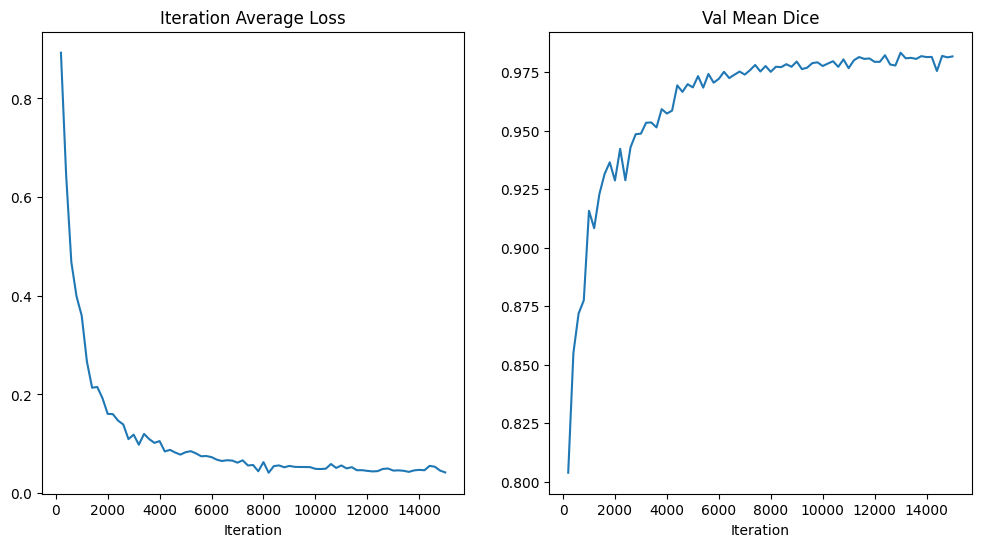

In [ ]:
# plot loss

plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Iteration Average Loss")
#CHANGE PER MODEL
x = [eval_num * (i + 1) for i in range(len(epoch_loss_values_unetwithaug))]
#CHANGE PER MODEL
y = epoch_loss_values_unetwithaug
plt.xlabel("Iteration")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
#CHANGE PER MODEL
x = [eval_num * (i + 1) for i in range(len(metric_values_unetwithaug))]
#CHANGE PER MODEL
y = metric_values_unetwithaug
plt.xlabel("Iteration")
plt.plot(x, y)
plt.show()

# Save the metric values and epoch loss values to separate files
#CHANGE PER MODEL
np.save(os.path.join(root_dir, (roi_type + "metric_values_unetwithaug.npy")), np.array(metric_values_unetwithaug))
#CHANGE PER MODEL
np.save(os.path.join(root_dir, (roi_type + "epoch_loss_values_unetwithaug.npy")), np.array(epoch_loss_values_unetwithaug))

In [ ]:
#CHANGE PER MODEL
torch.save(model.state_dict(), os.path.join(root_dir, (roi_type+"unet_withaug_best_metric_model.pth")))
#CHANGE PER MODEL
model.load_state_dict(torch.load(os.path.join(root_dir, (roi_type+"unet_withaug_best_metric_model.pth"))))

<All keys matched successfully>

In [ ]:
split_JSON_run = "face-training-1-lab-v1.json"


datasets_run = data_dir + split_JSON_run
val_files_run = load_decathlon_datalist(datasets_run, True, "validation")
val_ds_run = CacheDataset(
    data=val_files_run, transform=val_transforms, cache_num=300, cache_rate=1.0, num_workers=4
)
val_loader_run = DataLoader(
    val_ds_run, batch_size=1, shuffle=False, num_workers=4, pin_memory=True
)

Loading dataset: 100%|██████████| 12/12 [00:00<00:00, 29.82it/s]


In [ ]:
#CHANGE PER MODEL
model.load_state_dict(torch.load(os.path.join(root_dir, (roi_type+"unet_withaug_best_metric_model.pth"))), strict=False)
model.eval()

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.5, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
          (conv): Sequential(
            (unit0): Convolution(
              (conv): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
              (adn): ADN(
                (N): InstanceNorm3d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
                (D): Dropout(p=0.5, inplace=False)
                (A): PReLU(num_pa

0 261-img.nii.gz


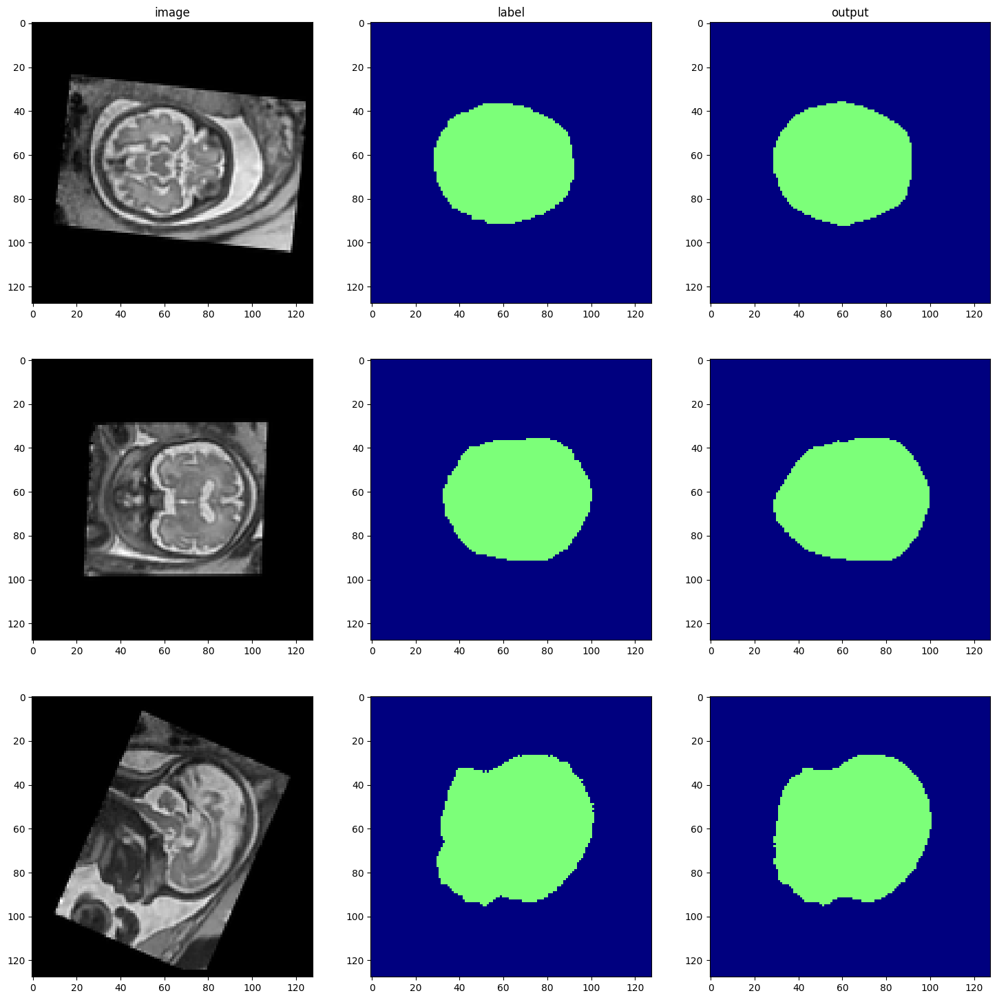

1 335-img.nii.gz


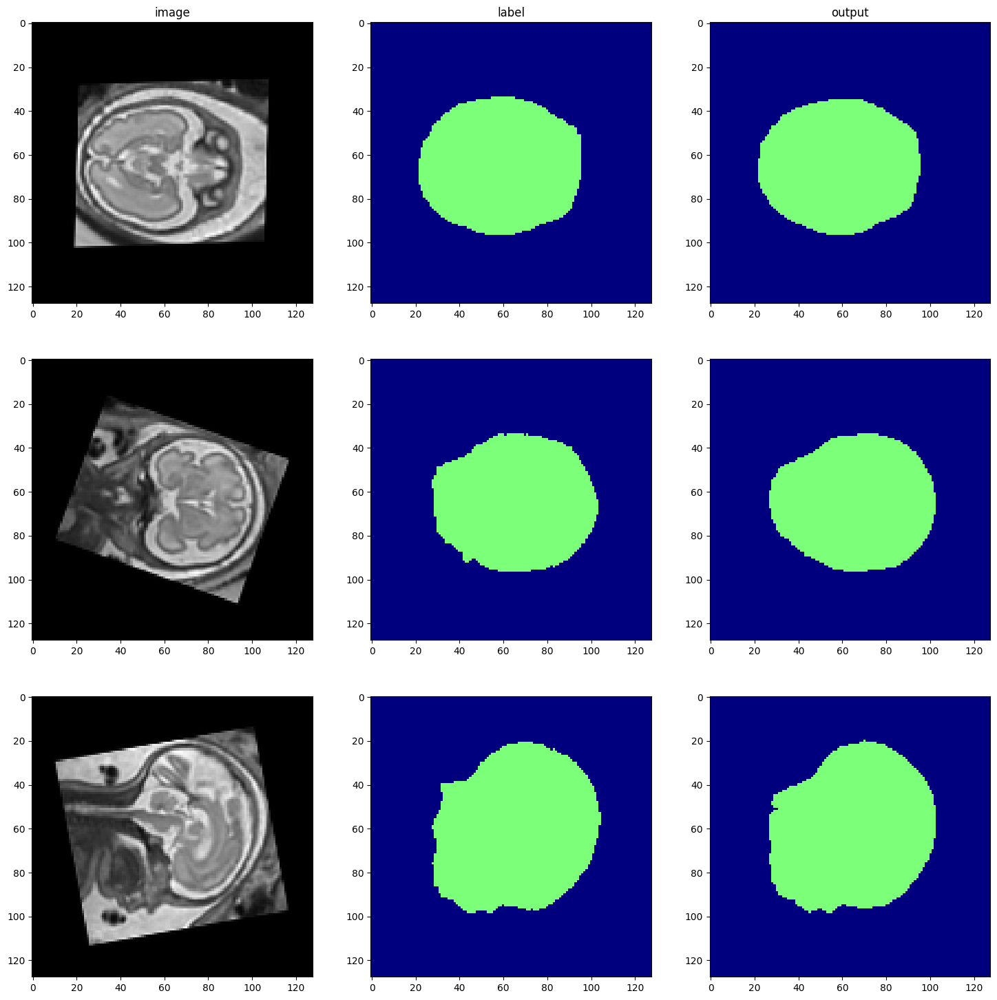

2 426-img.nii.gz


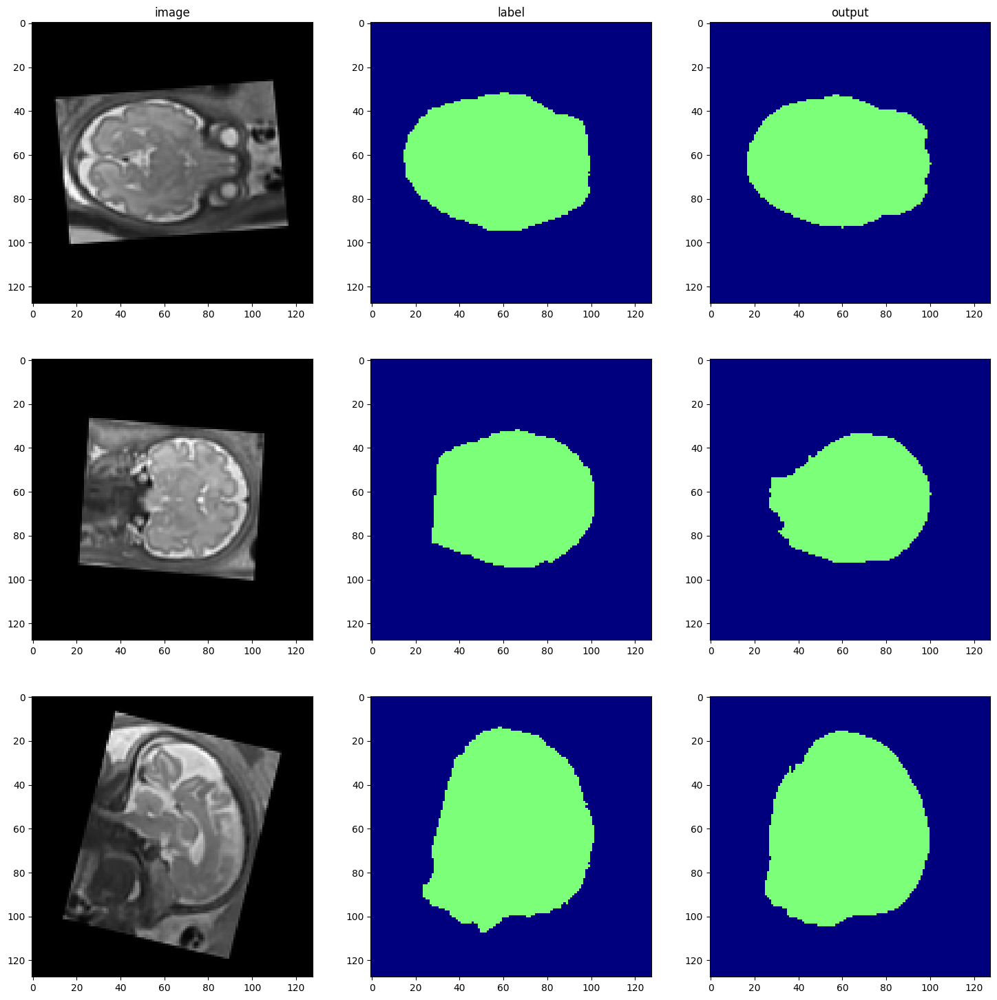

3 342-img.nii.gz


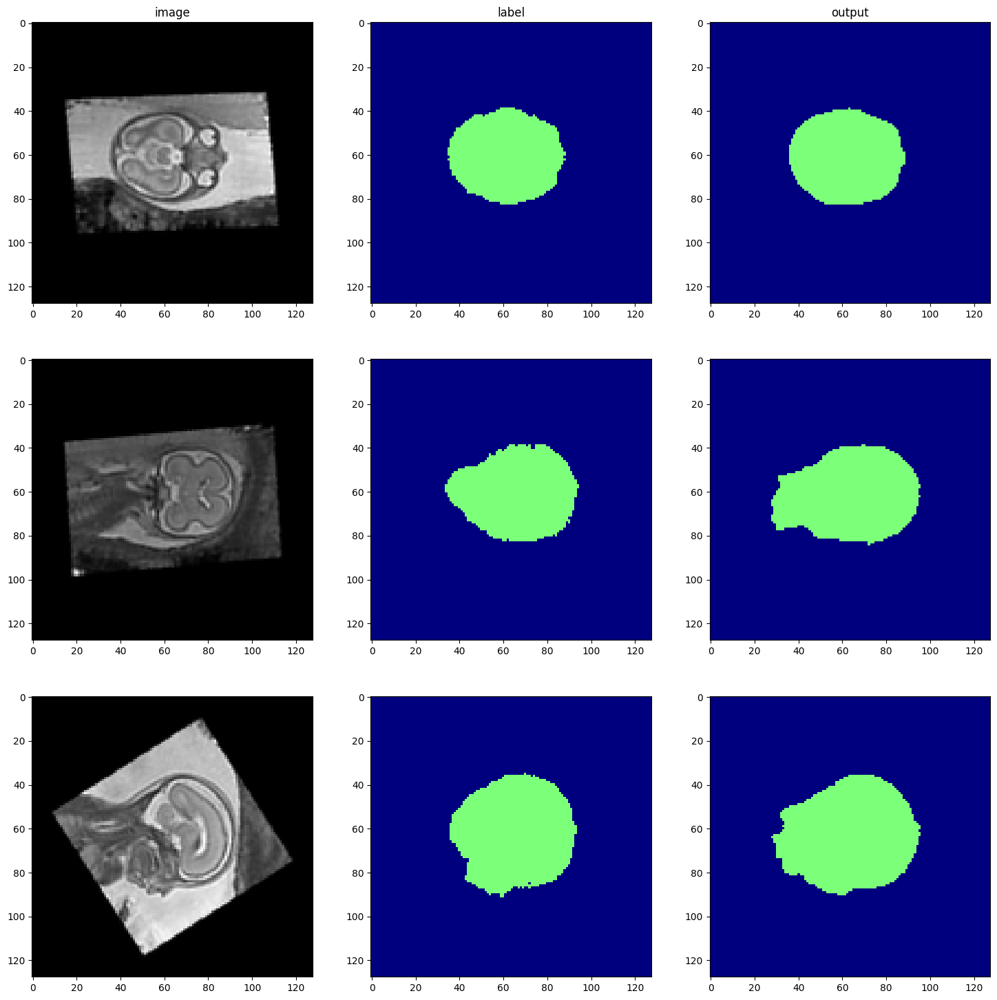

4 435-img.nii.gz


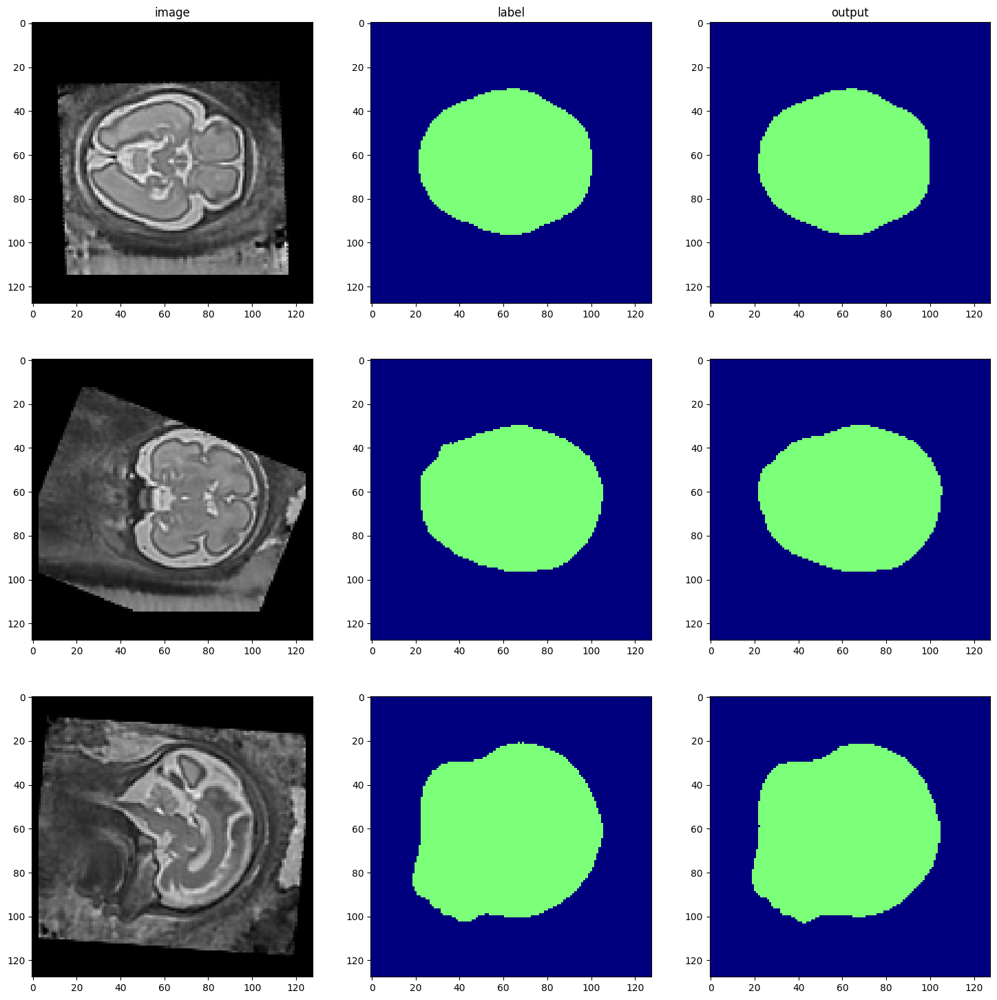

5 hist-136-img.nii.gz


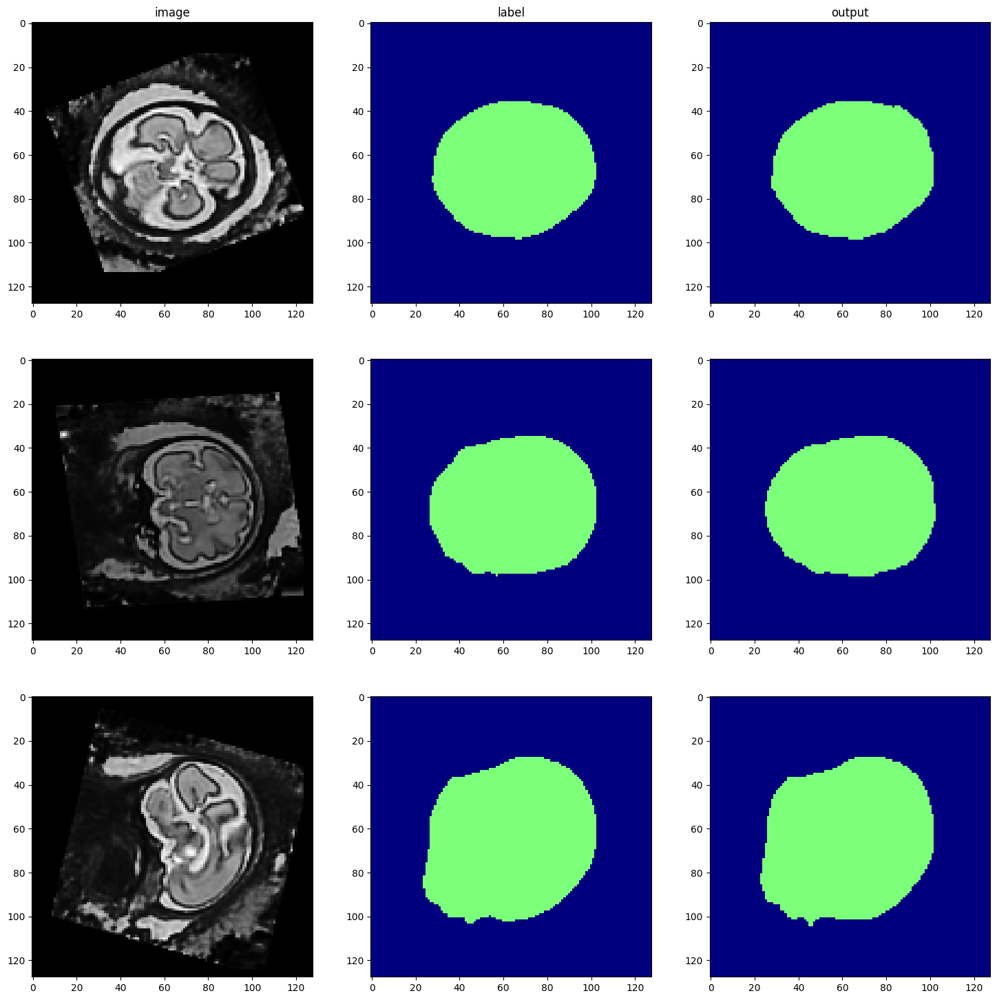

6 hist-214-img.nii.gz


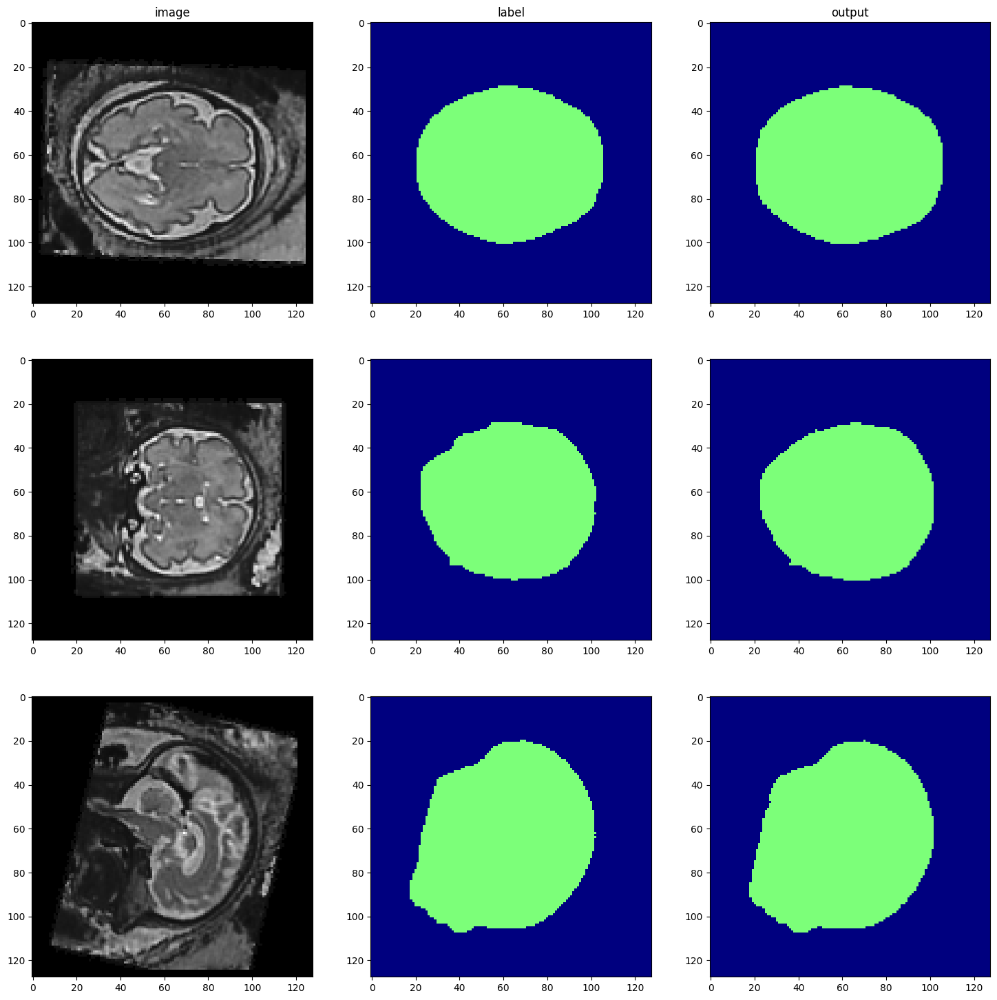

7 hist-236-img.nii.gz


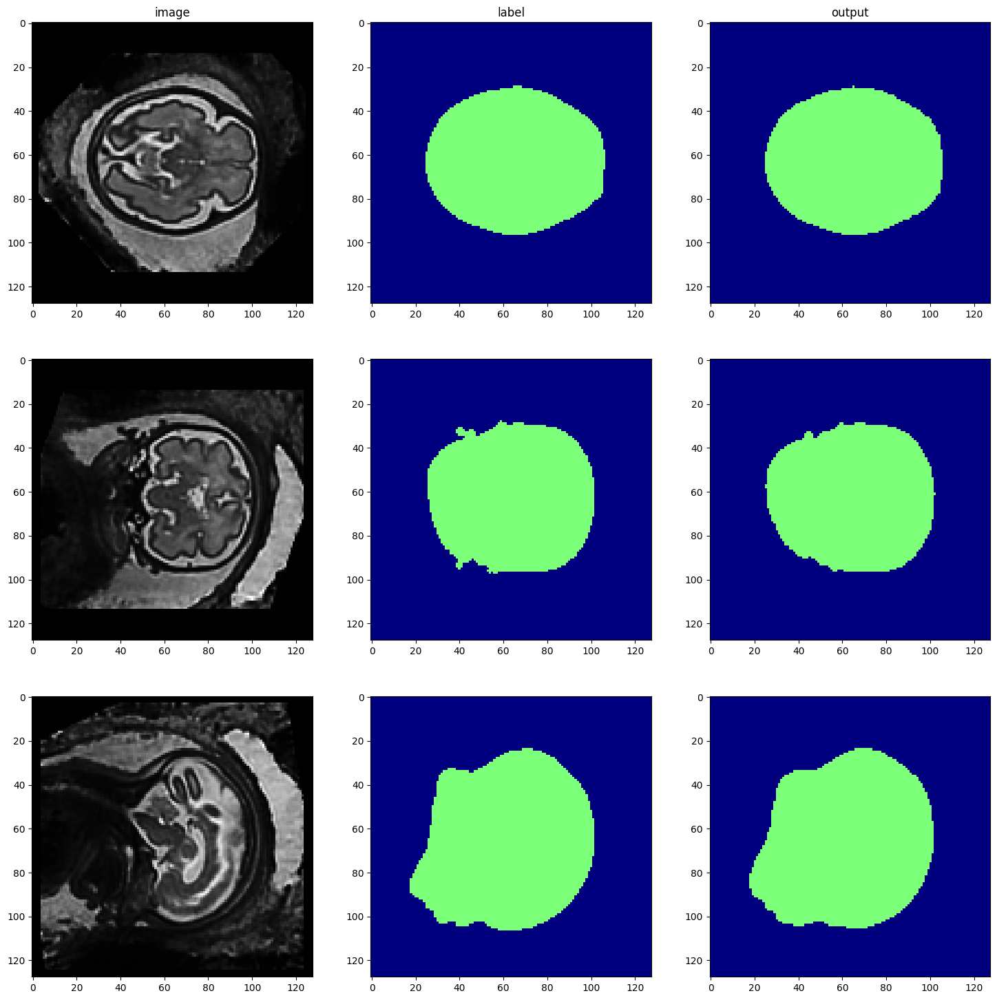

8 hist-253-img.nii.gz


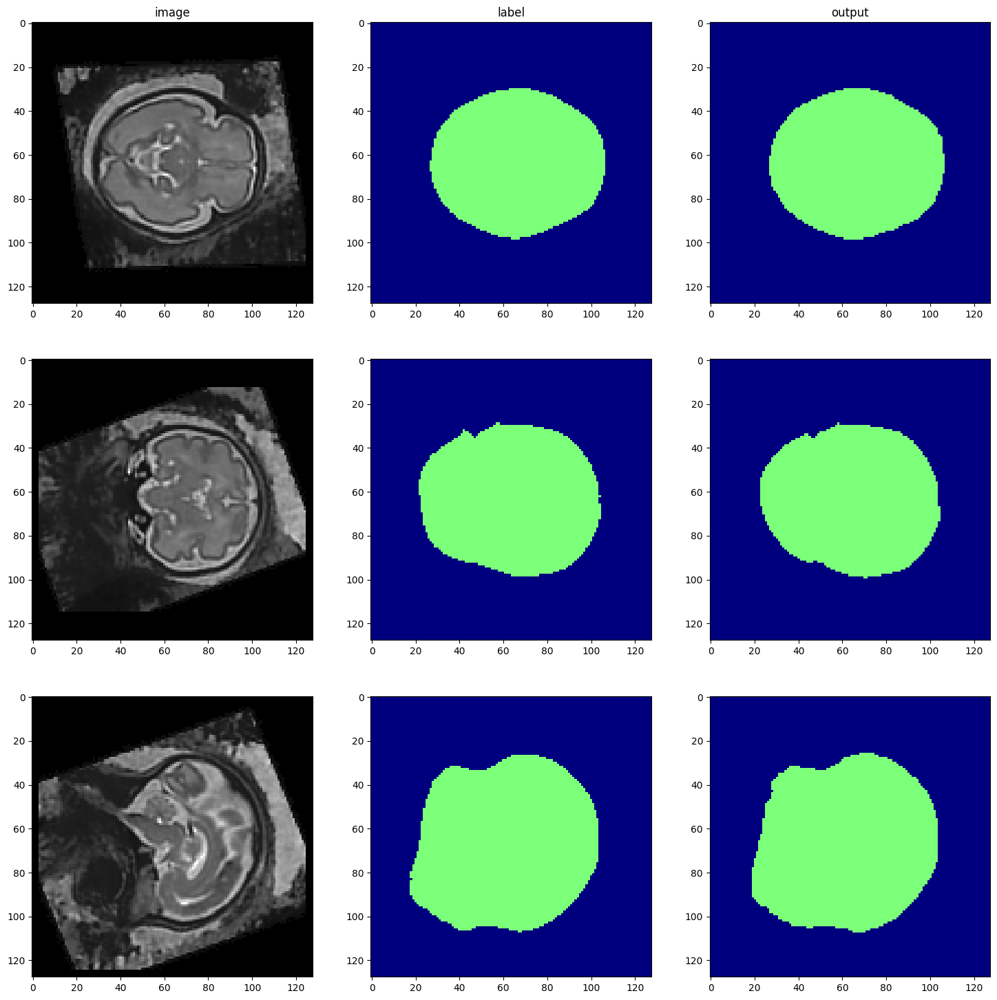

9 hist-275-img.nii.gz


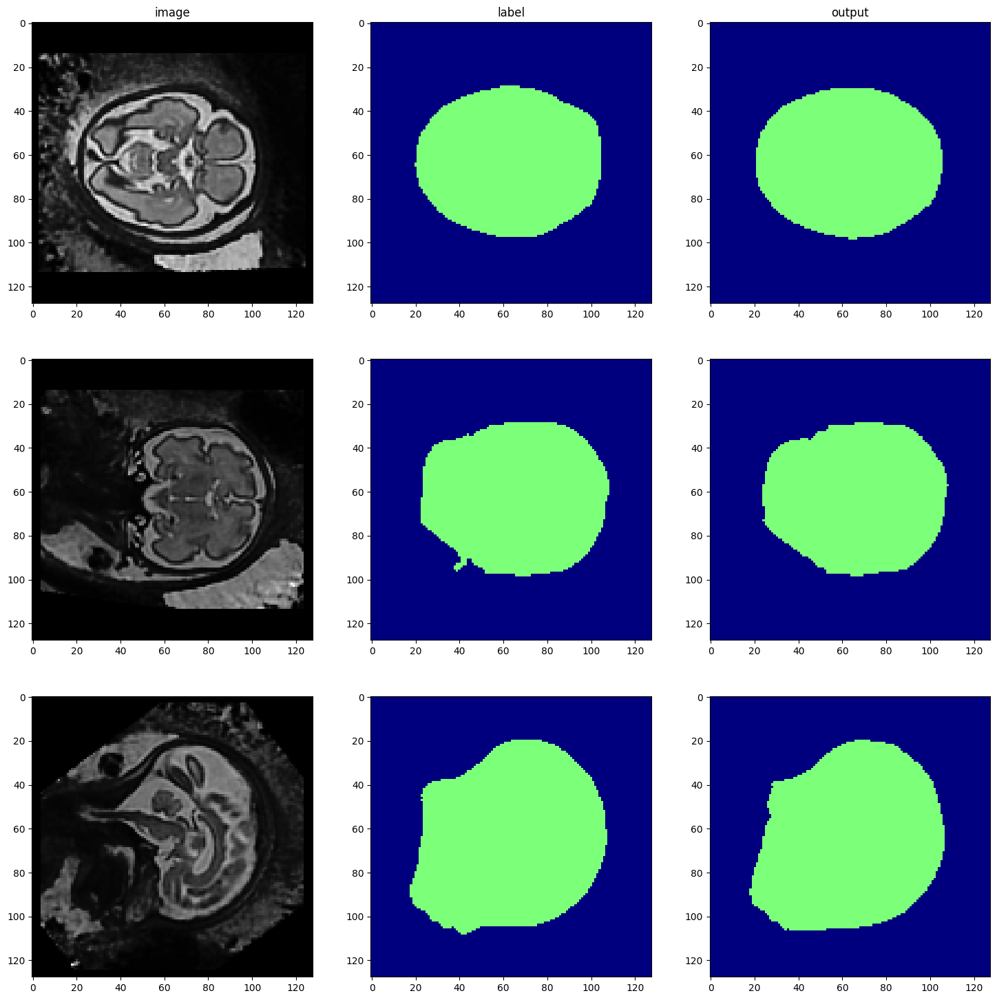

10 hist-292-img.nii.gz


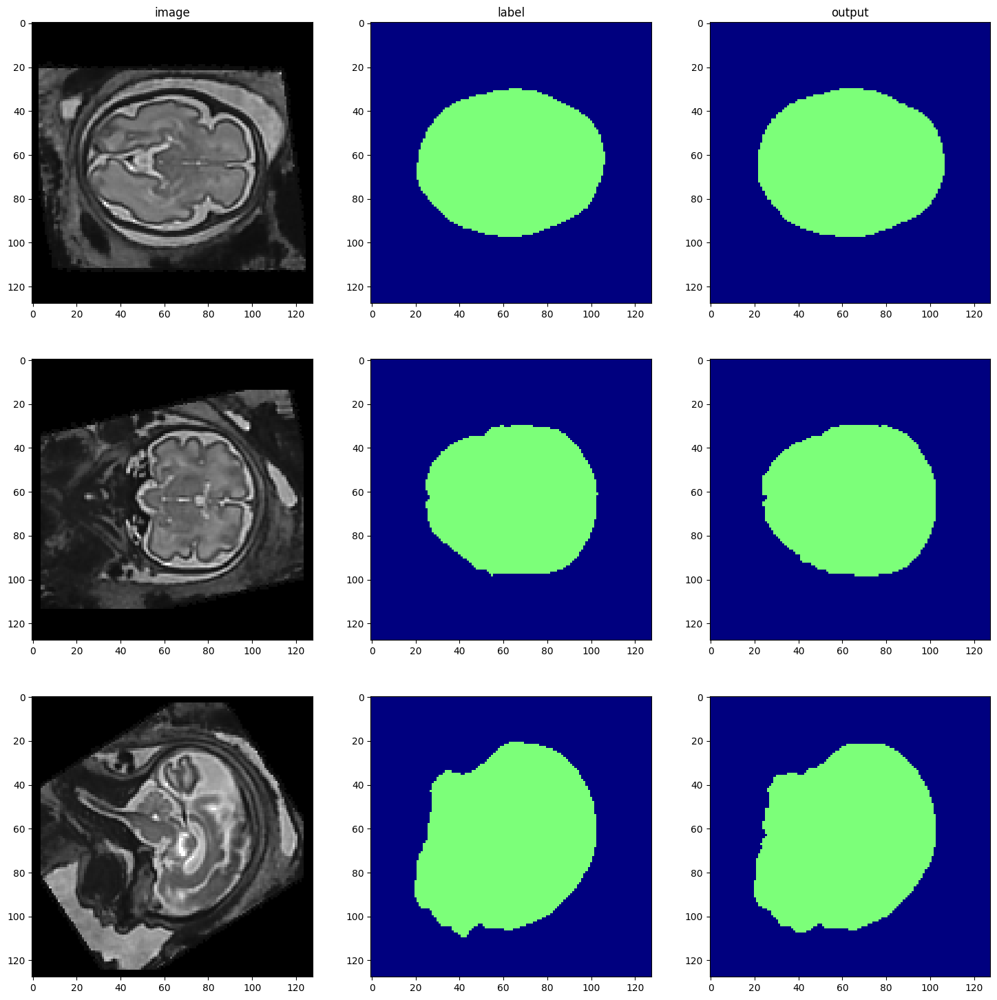

11 hist-355-img.nii.gz


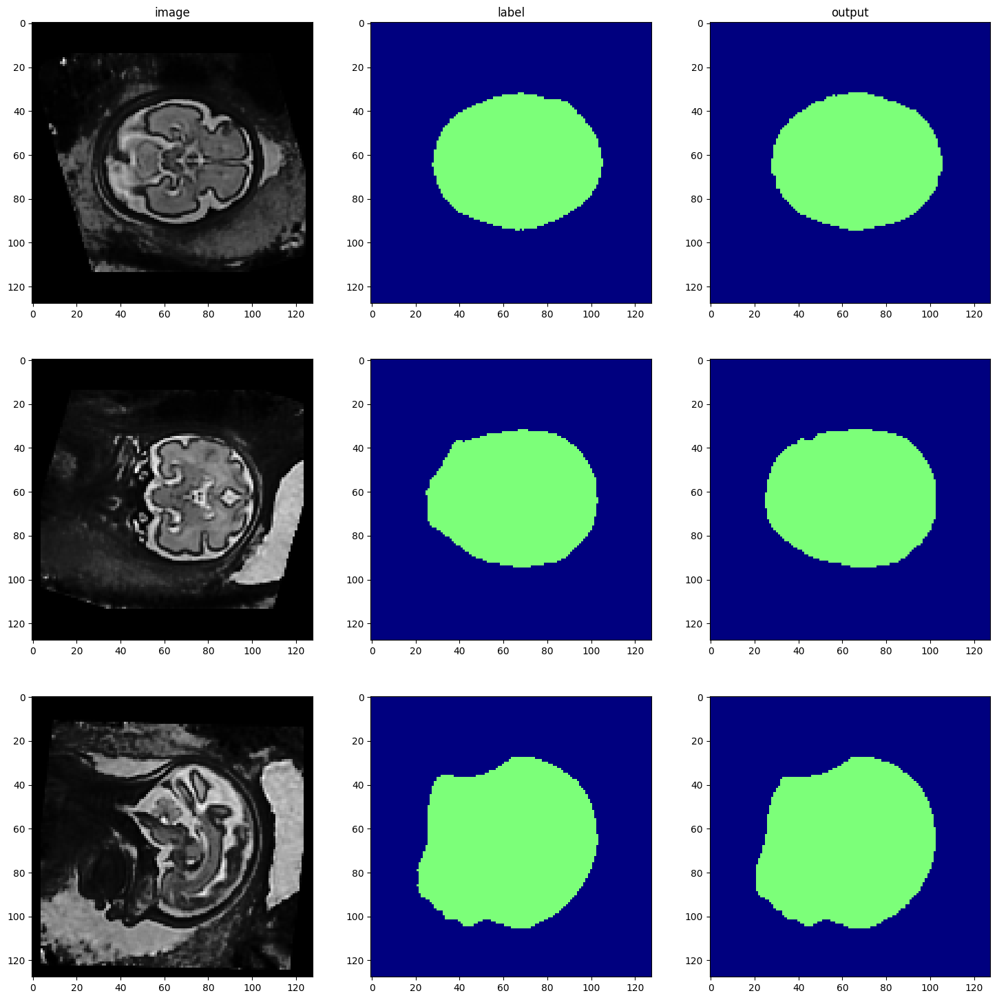

In [ ]:

class_n = class_num
qq=round(img_dim/2)

for x in range(len(val_files_run)):

  case_num = x
  with torch.no_grad():
      img_name = os.path.split(val_ds_run[case_num]["image_meta_dict"]["filename_or_obj"])[1]
      cur_case = val_ds_run[case_num]
      img = cur_case["image"]
      label = cur_case["label"]
      val_inputs = torch.unsqueeze(img, 1).cuda()
      val_labels = torch.unsqueeze(label, 1).cuda()
      val_outputs = sliding_window_inference(
          val_inputs, (img_dim, img_dim, img_dim), 4, model, overlap=0.8
      )

      print(x,img_name)

      plt.figure("check", (18, 18))
      plt.subplot(3, 3, 1)
      plt.title("image")
      plt.imshow(val_inputs.cpu().numpy()[0, 0, :, :, qq], cmap="gray")
      plt.subplot(3, 3, 2)
      plt.title("label")
      plt.imshow(val_labels.cpu().numpy()[0, 0, :, :, qq], vmin=0, vmax=class_n, cmap="jet")
      plt.subplot(3, 3, 3)
      plt.title("output")
      plt.imshow(torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, qq], vmin=0, vmax=class_n, cmap="jet")

      plt.subplot(3, 3, 4)
      plt.imshow(val_inputs.cpu().numpy()[0, 0, :, qq, :], cmap="gray")
      plt.subplot(3, 3, 5)
      plt.imshow(val_labels.cpu().numpy()[0, 0, :, qq, :], vmin=0, vmax=class_n, cmap="jet")
      plt.subplot(3, 3, 6)
      plt.imshow(torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, qq, :], vmin=0, vmax=class_n, cmap="jet")


      plt.subplot(3, 3, 7)
      plt.imshow(val_inputs.cpu().numpy()[0, 0, qq, :, :], cmap="gray")
      plt.subplot(3, 3, 8)
      plt.imshow(val_labels.cpu().numpy()[0, 0, qq, :, :], vmin=0, vmax=class_n, cmap="jet")
      plt.subplot(3, 3, 9)
      plt.imshow(torch.argmax(val_outputs, dim=1).detach().cpu()[0, qq, :, :], vmin=0, vmax=class_n, cmap="jet")

      plt.show()



In [ ]:
# save cnn segmentation results for all validation images

#CHANGE PER MODEL
res_dir = root_dir + "/" + roi_type + "3D_UNet_withaug_valid_results"

isdir = os.path.isdir(res_dir)
if not isdir:
  os.mkdir(res_dir)


for x in range(len(val_files_run)):

  case_num = x
  img_name = val_files_run[case_num]["label"]
  label_name = val_files_run[case_num]["label"]
  case_name = os.path.split(val_ds_run[case_num]["image_meta_dict"]["filename_or_obj"])[1]
  out_name = res_dir + "/cnn-lab-" + case_name
  print(case_num, out_name)

  img_tmp_info = nib.load(img_name)

  with torch.no_grad():
      img_name = os.path.split(val_ds_run[case_num]["image_meta_dict"]["filename_or_obj"])[1]
      img = val_ds_run[case_num]["image"]
      label = val_ds_run[case_num]["label"]
      val_inputs = torch.unsqueeze(img, 1).cuda()
      val_labels = torch.unsqueeze(label, 1).cuda()
      val_outputs = sliding_window_inference(
          val_inputs, (img_dim, img_dim, img_dim), 4, model, overlap=0.8
      )

      out_label = torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, :]
      out_lab_nii = nib.Nifti1Image(out_label, img_tmp_info.affine, img_tmp_info.header)
      nib.save(out_lab_nii, out_name)


0 /content/drive/MyDrive/face-seg-project-2023/new-training-062023//face_3D_UNet_withaug_valid_results/cnn-lab-261-img.nii.gz
1 /content/drive/MyDrive/face-seg-project-2023/new-training-062023//face_3D_UNet_withaug_valid_results/cnn-lab-335-img.nii.gz
2 /content/drive/MyDrive/face-seg-project-2023/new-training-062023//face_3D_UNet_withaug_valid_results/cnn-lab-426-img.nii.gz
3 /content/drive/MyDrive/face-seg-project-2023/new-training-062023//face_3D_UNet_withaug_valid_results/cnn-lab-342-img.nii.gz
4 /content/drive/MyDrive/face-seg-project-2023/new-training-062023//face_3D_UNet_withaug_valid_results/cnn-lab-435-img.nii.gz
5 /content/drive/MyDrive/face-seg-project-2023/new-training-062023//face_3D_UNet_withaug_valid_results/cnn-lab-hist-136-img.nii.gz
6 /content/drive/MyDrive/face-seg-project-2023/new-training-062023//face_3D_UNet_withaug_valid_results/cnn-lab-hist-214-img.nii.gz
7 /content/drive/MyDrive/face-seg-project-2023/new-training-062023//face_3D_UNet_withaug_valid_results/cnn-l